In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

class Function:
    def __init__(self, name = ""):
        self.output = 0
        self.name = name
    
    def __call__(self, X):
        pass

    def grad(self):
        pass
    
    def string(self):
        pass

class Sigmoid(Function):
    def __init__(self):
        super().__init__("Sigmoid")
    
    def __call__(self, X):
        self.output = 1 / (1 +np.exp(-X))
        return self.output
    
    def grad(self):
        return self.output * (1 - self.output)

    def string(self):
        return self.name
    
    def __str__(self):
        return self.name
    
    def __repr__(self):
        return self.name

class Tanh(Function):
    def __init__(self):
        super().__init__("Hyperbolic Tangent")
    
    def __call__(self, X):
        self.output = np.tanh(X)
        return self.output
    
    def grad(self):
        return 1 - self.output ** 2
    
    def string(self):
        return self.name
    
    def __str__(self):
        return self.name
    
    def __repr__(self):
        return self.name
    
class ReLU(Function):
    def __init__(self):
        super().__init__("Recirtified Linear Unit")
    
    def __call__(self, X):
        self.output = np.maximum(0, X)
        return self.output
    
    def grad(self):
        return np.where(self.output > 0, 1, 0)
    
    def string(self):
        return self.name
    
    def __str__(self):
        return self.name
    
    def __repr__(self):
        return self.name
    
class Leaky_ReLU(Function):
    def __init__(self):
        super().__init__("Leaky ReLU")
    
    def __call__(self, X):
        self.output = np.maximum(0.01 * X, X)
        return self.output
    
    def grad(self):
        return np.where(self.output > 0, 1, 0.01)
    
    def string(self):
        return self.name
    
    def __str__(self):
        return self.name
    
    def __repr__(self):
        return self.name
    
class Identity(Function):
    def __init__(self):
        super().__init__("Identity")
        
    def __call__(self, X):
        return X
    
    def grad(self):
        return 1

    def string(self):
        return self.name
    
    def __str__(self):
        return self.name
    
    def __repr__(self):
        return self.name
    
class MSE:
    def __init__(self):
        super().__init__("Mean Squared Error")
        
    def __call__(self, Y, Y_hat):
        self.diff = Y - Y_hat
        self.output = np.square(self.diff).mean()
        return self.output
    
    def grad(self):
        return self.diff

    def string(self):
        return self.name
    
    def __str__(self):
        return self.name
    
    def __repr__(self):
        return self.name

In [2]:
import pprint
import networkx as nx
from networkx.drawing.nx_agraph import graphviz_layout
from itertools import permutations

class Layer:
    def __init__(self, input_size, output_size, activation : Function, alpha = 0.001):
        self.input_size = input_size
        self.output_size = output_size
        self.weight = np.random.randn(output_size, input_size) * np.sqrt(1. / output_size)
        self.bias = np.random.randn(output_size, 1)
        self.activation = activation
        self.alpha = alpha

    def forward(self, _a):
        self.x = _a
        self.z = np.dot(self.weight, _a) + self.bias
        self.a = self.activation(self.z)
        return self.a

    def backward(self, diff):
        error = diff * self.activation.grad()
        dw = np.outer(error, self.x)
        diff = np.dot(self.weight.T, error)
        return diff, dw
    
class Sequential:
    def __init__(self, layers = [], epochs = 1000, alpha = 0.001):
        self.pp = pprint.PrettyPrinter(indent=4)
        self.alpha = alpha
        self.layers = layers
        self.epochs = epochs
        self.desc = f"----------Sequential----------\nAlpha : {alpha}, Epochs : {epochs}\nCost Function : Mean Squared Error\n"
        self._model = {}
    
    def add(self, input_size, output_size, activation : Function):
        activation_func = activation()
        self.layers.append(Layer(input_size, output_size, activation_func, self.alpha))
        layer_desc = "\t".join([f"Input size : {input_size:>5}", f"Output size : {output_size:>5}", f"Activation : {activation_func.string()}"]) + '\n'
        self.desc += layer_desc
        
    def compile(self):
        self._model['layers'] = self.layers
        self.desc += "------------------------------"
        self.summary()
        return self
    
    def graph_init(self):
        self.G = nx.DiGraph()
        self.edges = []
        nodes = []
        num_nodes = 0
        for layer in self._model['layers']:
            input_size = layer.input_size + 1
            nodes.append(range(num_nodes, num_nodes + input_size))
            num_nodes += input_size
        num_nodes += self._model['layers'][-1].output_size
        nodes.append(range(num_nodes, num_nodes + self._model['layers'][-1].output_size))
        
        for i in range(len(nodes) - 1):
            from_nodes = nodes[i]
            to_nodes = nodes[i+1]
            first_from_node = from_nodes[0]
            first_to_node = to_nodes[0] + 1
            param = np.concatenate((self._model['params'][i]['b'], self._model['params'][i]['w']), axis=1)
            for idx, to_node in enumerate(to_nodes):
                if idx == 0:
                    continue
                for from_node in from_nodes:
                    weight = param[to_node - first_to_node][from_node - first_from_node]
                    self.edges.append([from_node, to_node, weight])
                    
        self.g_nodes = nodes
        
    def plot_graph(self):
        
        self.G.add_weighted_edges_from(self.edges)

        pos_idx = 0
        
        pos = {}
        
        for nodes in self.g_nodes:
            for node, i in zip(nodes, range(len(nodes))):
                pos[node] = [pos_idx, (i - len(nodes) / 2) * -(len(self.G.nodes) * 2000)]
            pos_idx += (len(self.G.nodes) * 10000)
        nx.draw(self.G, with_labels=True,pos=pos, font_weight='bold')

        all_weights = []
        for (node1,node2,data) in self.G.edges(data=True):
            all_weights.append(data['weight'])

        unique_weights = list(set(all_weights))

        for weight in unique_weights:
            weighted_edges = [(node1,node2) for (node1,node2,edge_attr) in self.G.edges(data=True) if edge_attr['weight']==weight]
            width = weight*len(self.g_nodes) * 4. / sum(all_weights)
            nx.draw_networkx_edges(self.G,pos, edgelist=weighted_edges, width=width)
        
    def feed_forward(self, X):
        _a = X
        for idx, layer in enumerate(self._model['layers']):
            _a = layer.forward(_a)
        output = _a
        return output
    
    def back_propagation(self, Y, Y_hat):
        diff = (Y_hat - Y) / Y_hat.shape[0]
        to_update = []
        for idx, layer in reversed(list(enumerate(self._model['layers']))):
            diff, dw = layer.backward(diff)
            to_update.append(dw)
            
        for dw, layer in zip(reversed(to_update), self._model['layers']):
            layer.weight -= self.alpha * dw
        
    def predict(self, X):
        out = []
        for x in X:
            out.append(self.feed_forward(x))
        return np.array(out)
    
    def fit(self, X, Y, early_stopping = -1, print_jump = 1, history=False):
        mse_history = []
        for epoch in range(self.epochs):
            mse = []
            y_pred = []
            for x, y in zip(X, Y):
                y_hat = self.feed_forward(x)
                y_pred.append(y_hat)
                mse.append((y - y_hat) ** 2)
                self.back_propagation(y, y_hat)
            mse = np.array(mse).mean()
            
            if epoch == 0:
                self.first_mse = mse
            
            if epoch % print_jump == 0:
                mse_history.append(mse)
                print(f'Epoch : {epoch} | MSE : {mse}')
                if history:
                    self.plot_progress(X, Y, y_pred, self.epochs, mse_history, print_jump)
            
            if mse < early_stopping:
                print(f'\n{epoch} epoch spent. Early stop by MSE ({mse}) < {early_stopping}.\n')
                break
    
    def result(self, graph=False):
        self._model['params'] = []
        for layer in self._model['layers']:
            w = layer.weight
            b = layer.bias
            self._model['params'].append({'w' : w, 'b' : b})
        
        self.graph_init()
        self.plot_graph()
        self.G.clear()
        #self.pp.pprint(self._model['params'])
    
    def summary(self):
        print(self.desc)
        
    def plot_progress(self, x, y, y_hat, epochs, mse, print_jump):
        fig, axs = plt.subplots(1, 2, figsize=(16, 8))
        ax1 = axs[0]
        ax2 = axs[1]
        ax1 = plt.subplot(1, 2, 1)
        ax1.scatter(x, y, s=2)
        ax1.scatter(x, y_hat, s=2)

        ax2 = plt.subplot(1, 2, 2)
        ax2.set_xlim([-10, self.epochs +10])
        ax2.set_ylim([0, mse[0]/10])
        ax2.plot(range(0, epochs, print_jump)[:len(mse)], mse)
        ax2.set_title(f'MSE : {mse[-1]}')
        plt.tight_layout()
        plt.savefig('figure'+f'{len(mse)}'.zfill(4))
        plt.show()

In [3]:
model = Sequential(epochs = 501, alpha = 0.001)

input_size = 1
output_size = 1
model.add(input_size, 4, Tanh)
model.add(4, 8, Tanh)
model.add(8, 4, Tanh)
model.add(4, 2, Tanh)
model.add(2, output_size, Identity)
model.compile()

----------Sequential----------
Alpha : 0.001, Epochs : 501
Cost Function : Mean Squared Error
Input size :     1	Output size :     4	Activation : Hyperbolic Tangent
Input size :     4	Output size :     8	Activation : Hyperbolic Tangent
Input size :     8	Output size :     4	Activation : Hyperbolic Tangent
Input size :     4	Output size :     2	Activation : Hyperbolic Tangent
Input size :     2	Output size :     1	Activation : Identity
------------------------------


Epoch : 0 | MSE : 3.0992739488914345


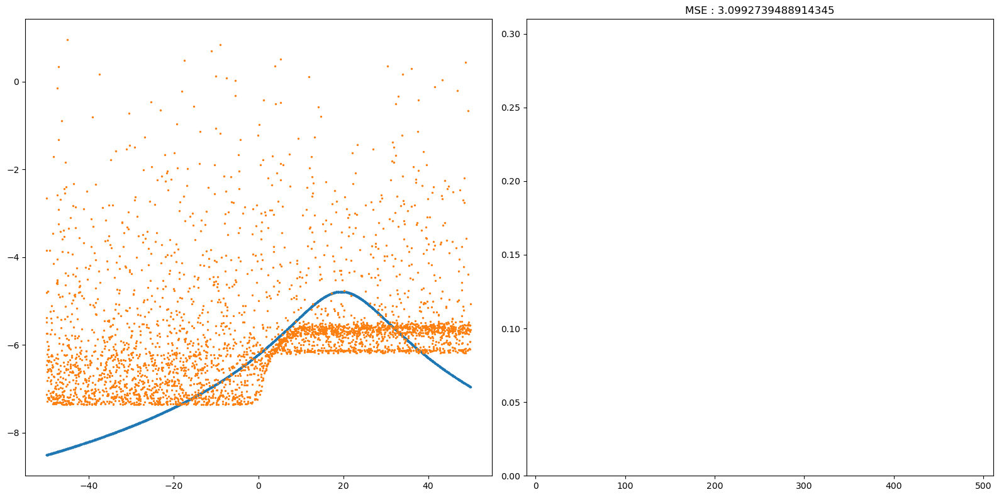

Epoch : 5 | MSE : 0.18194150562394654


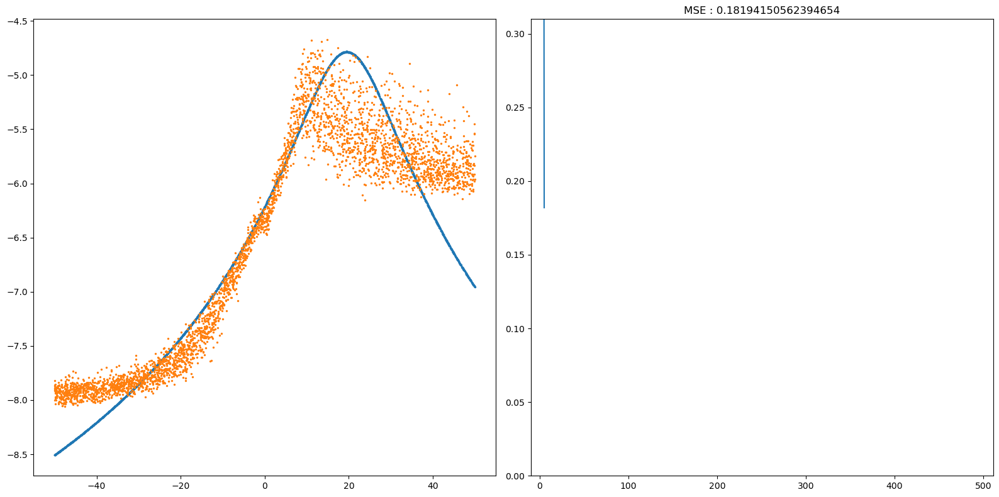

Epoch : 10 | MSE : 0.0722974492705694


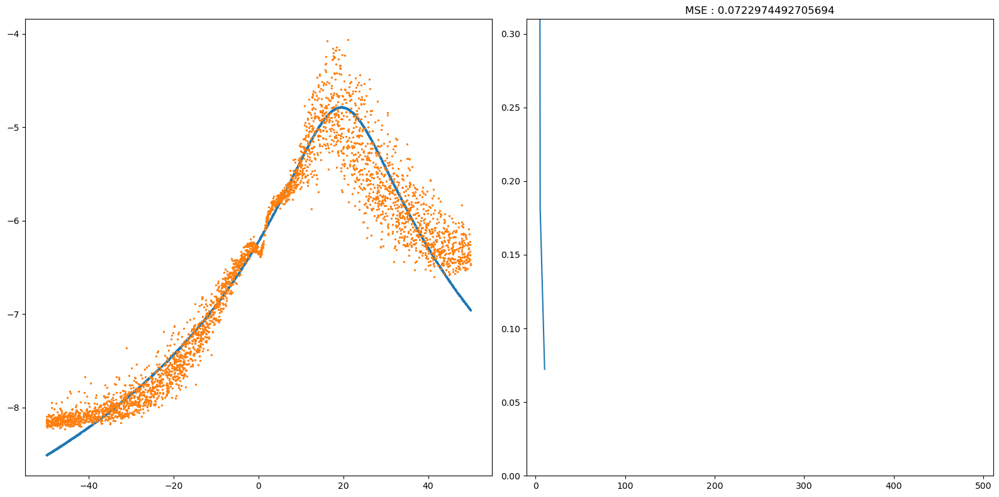

Epoch : 15 | MSE : 0.06236071497423597


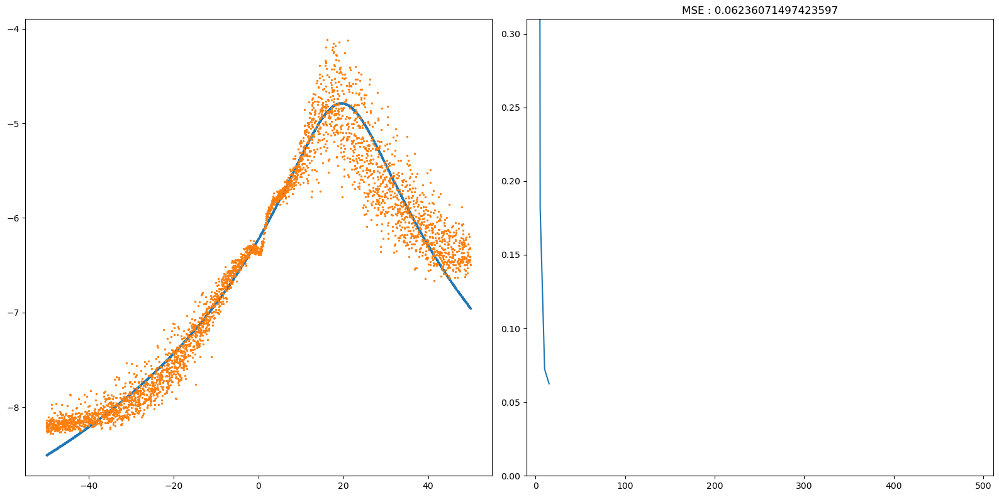

Epoch : 20 | MSE : 0.05649732982005059


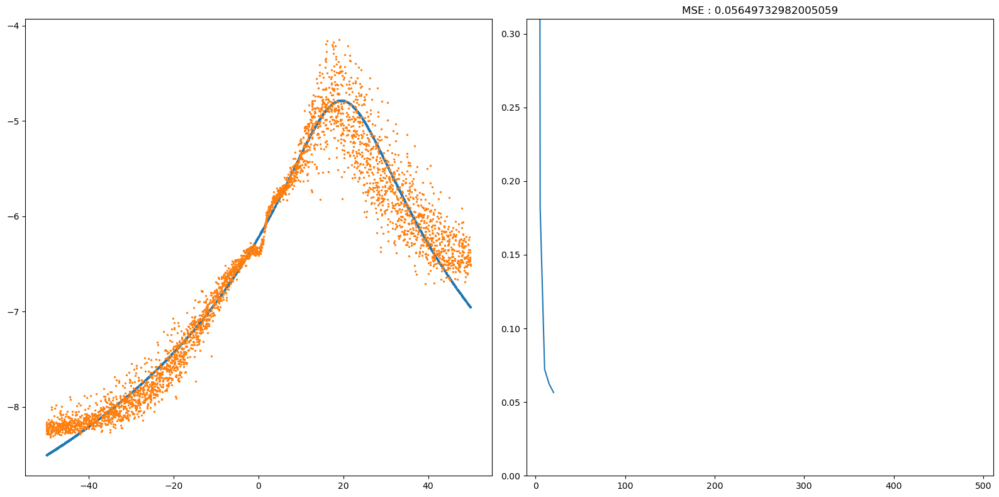

Epoch : 25 | MSE : 0.052245278231706896


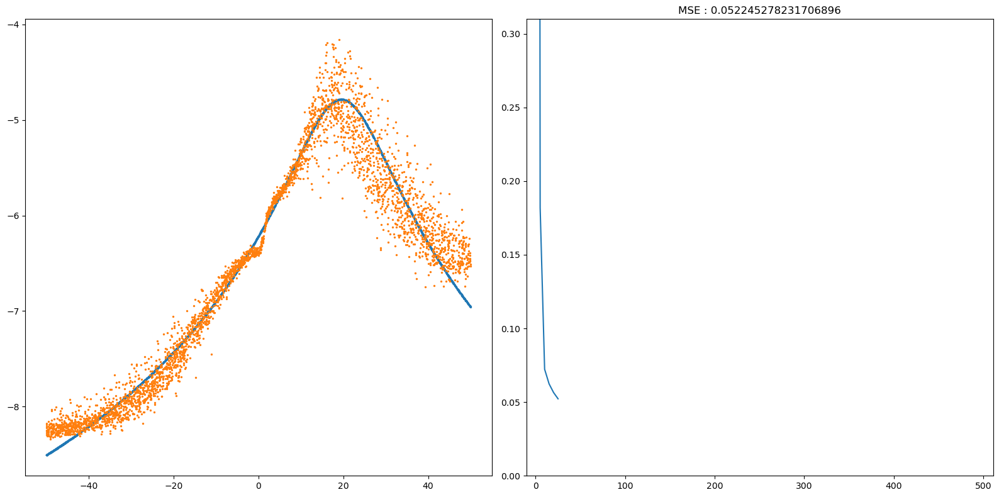

Epoch : 30 | MSE : 0.048821108146567226


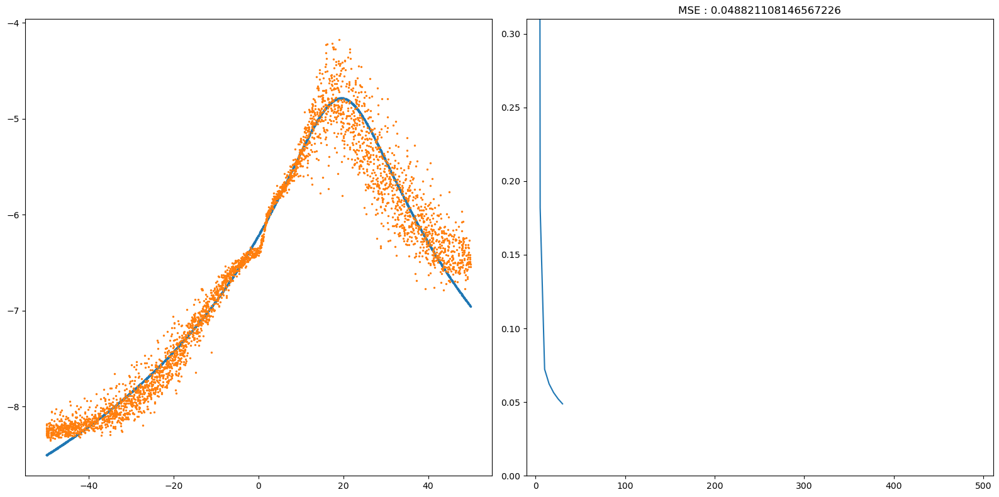

Epoch : 35 | MSE : 0.045847064453095866


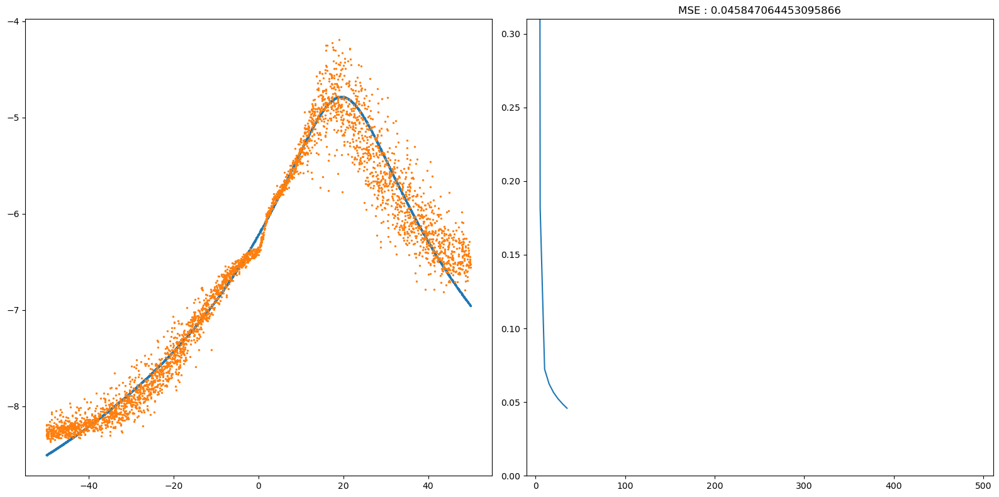

Epoch : 40 | MSE : 0.043126442592824867


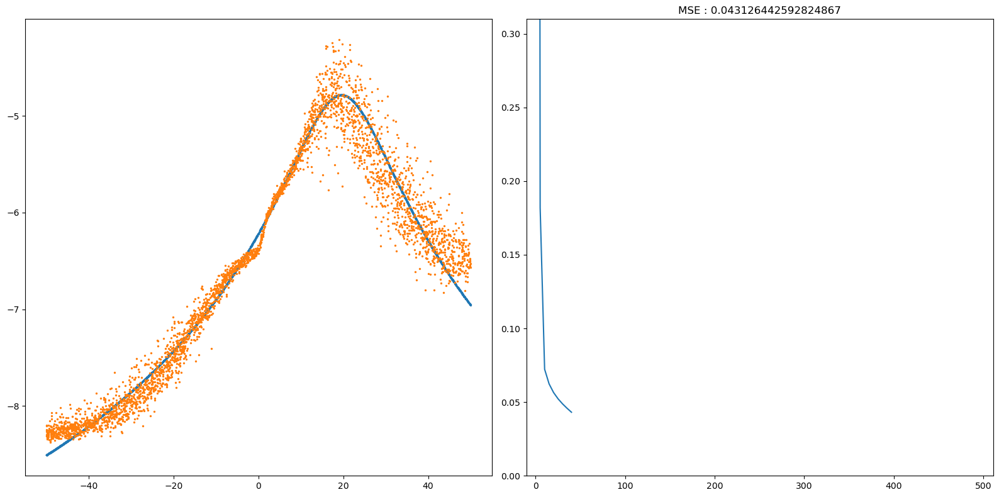

Epoch : 45 | MSE : 0.04057293161722889


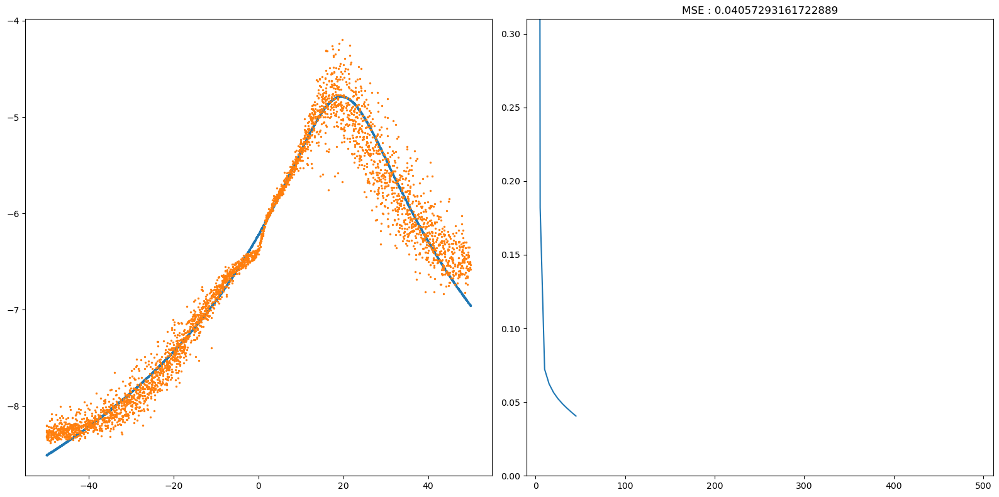

Epoch : 50 | MSE : 0.03814754509734993


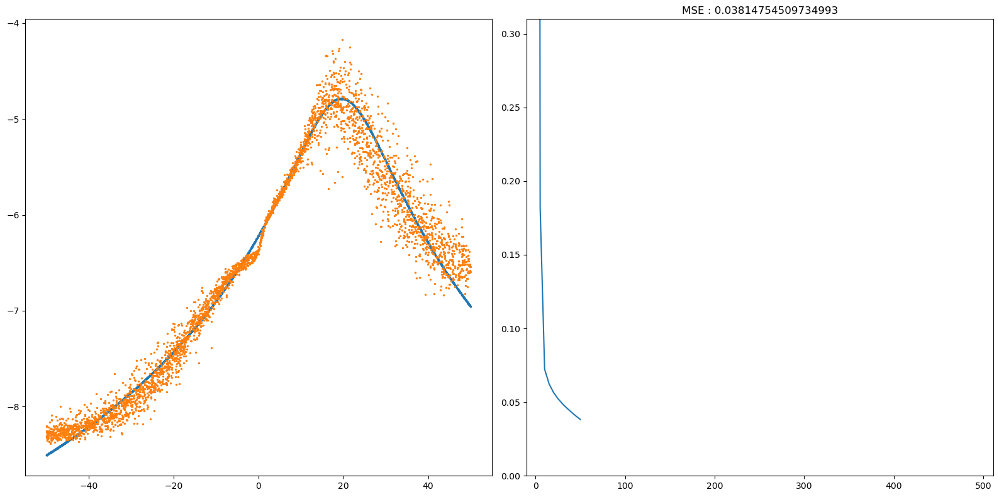

Epoch : 55 | MSE : 0.03576799995022342


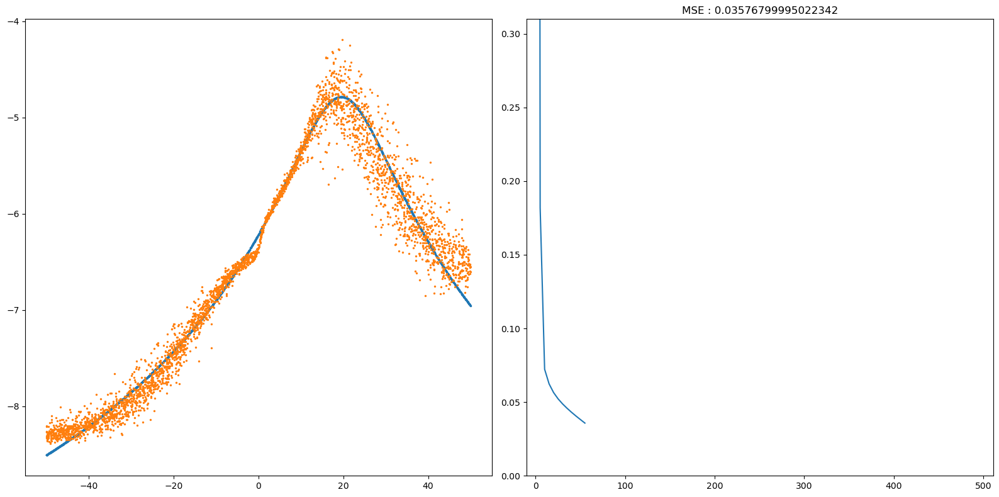

Epoch : 60 | MSE : 0.033417213373027464


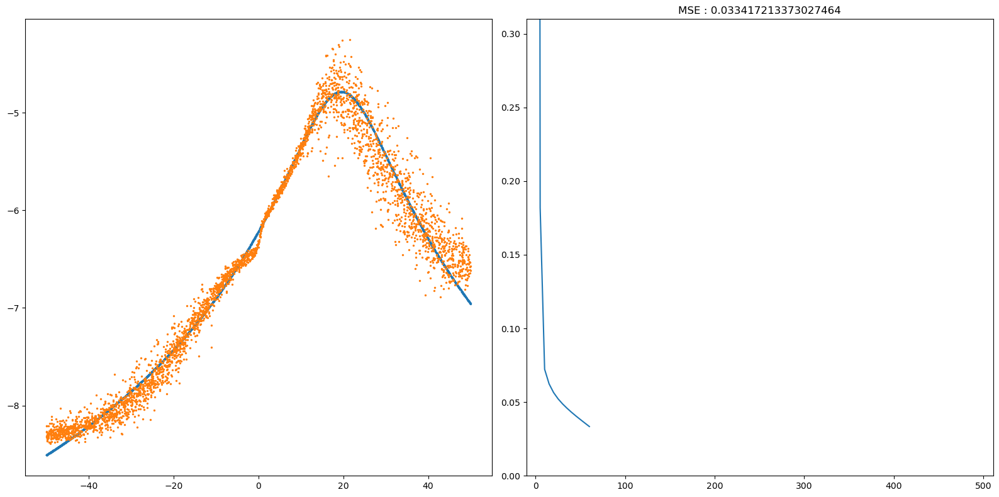

Epoch : 65 | MSE : 0.03129552771272047


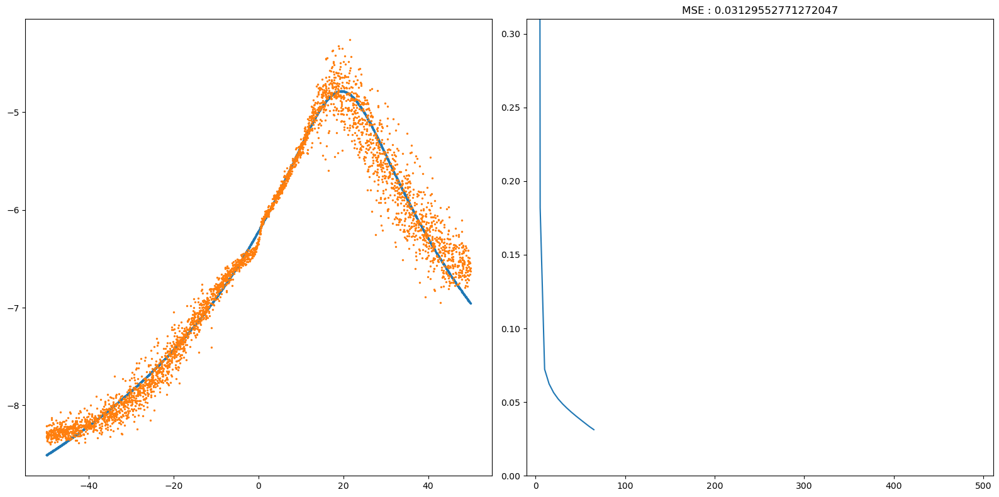

Epoch : 70 | MSE : 0.029469076516032706


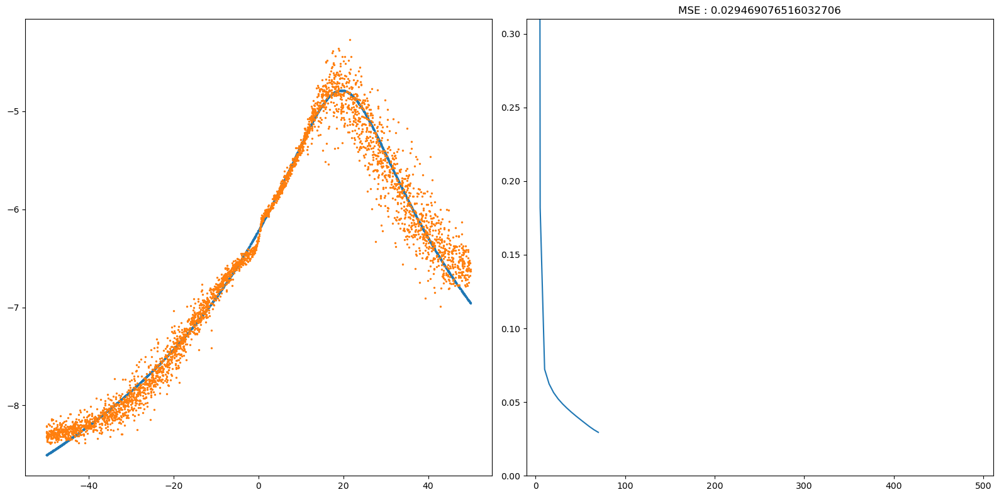

Epoch : 75 | MSE : 0.027901303916391246


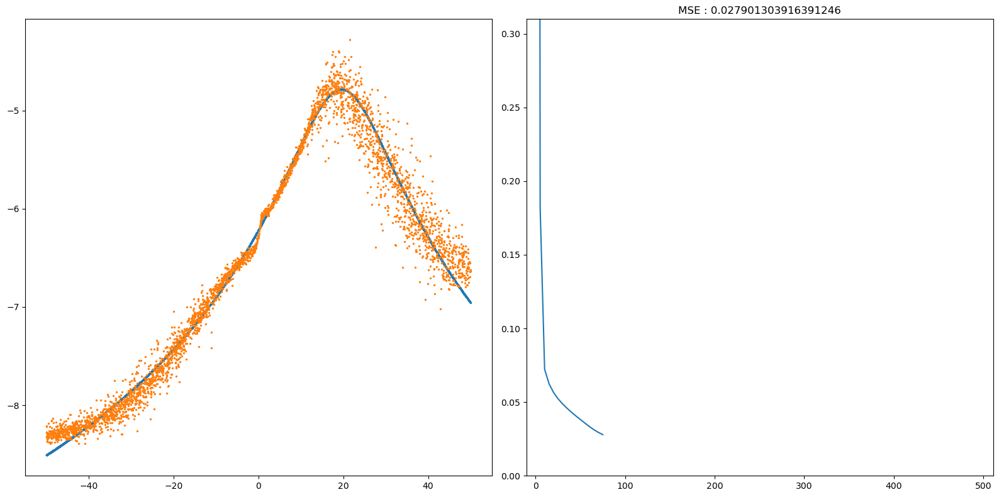

Epoch : 80 | MSE : 0.026533941442690816


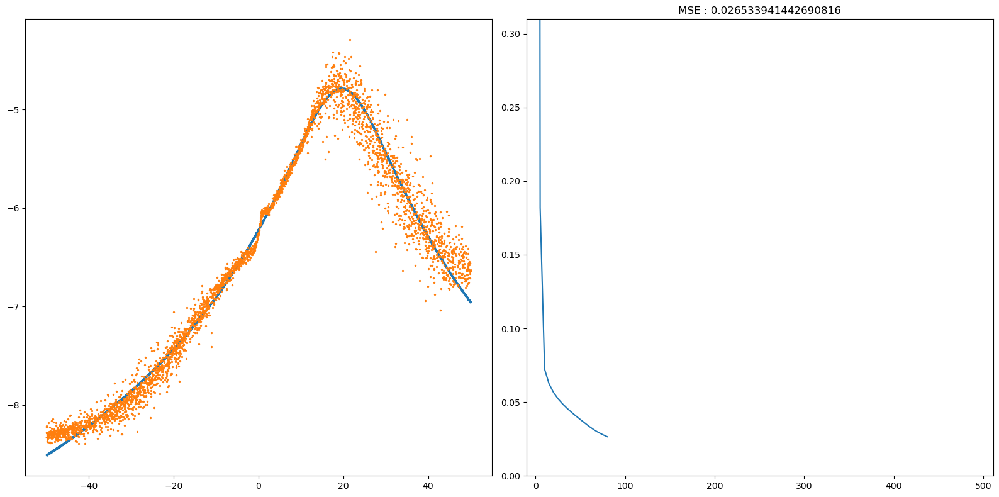

Epoch : 85 | MSE : 0.025307036614803054


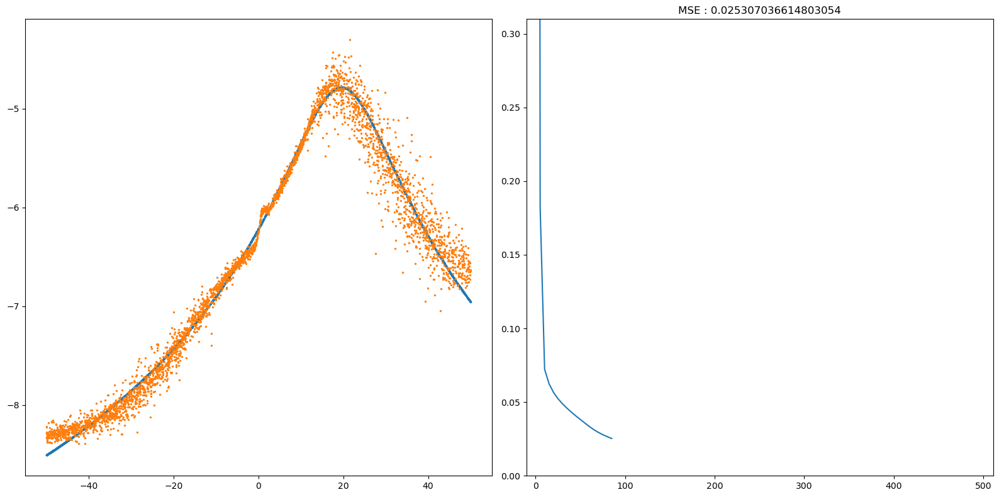

Epoch : 90 | MSE : 0.024183532285740973


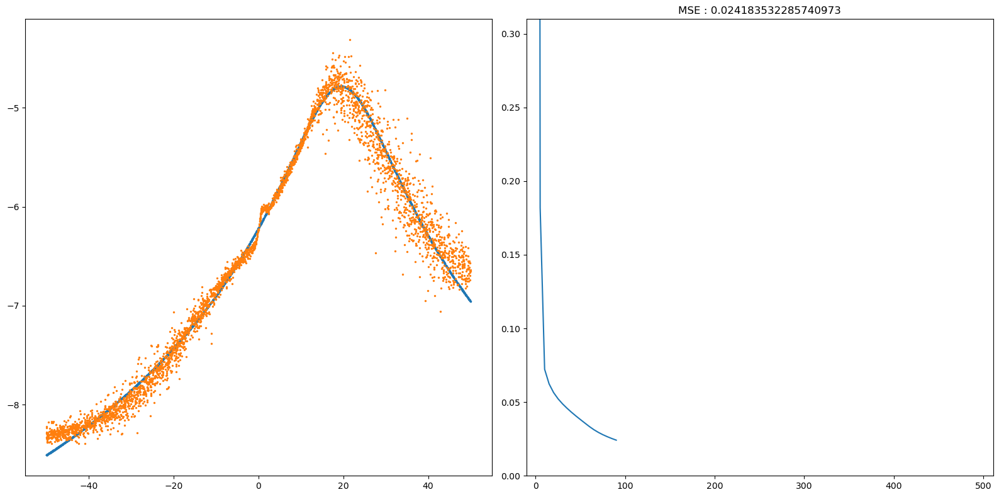

Epoch : 95 | MSE : 0.023144367133903228


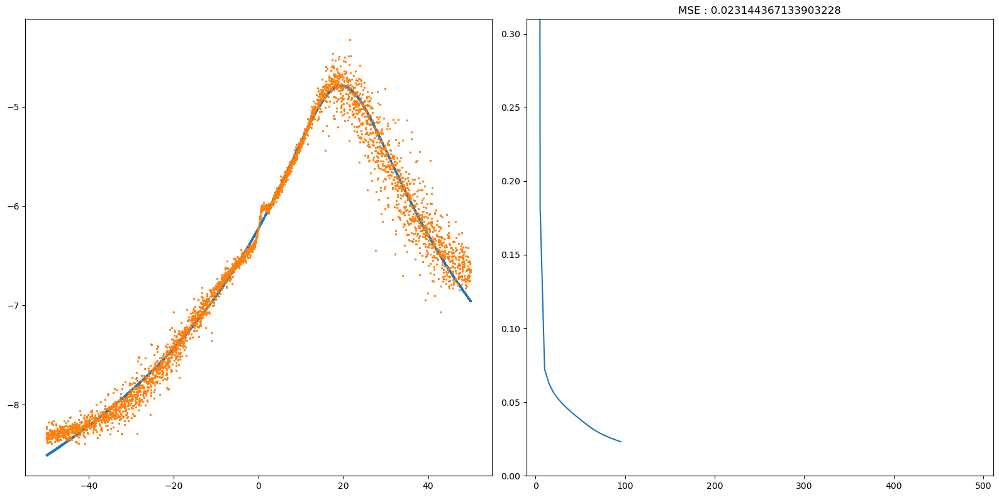

Epoch : 100 | MSE : 0.02217888580988387


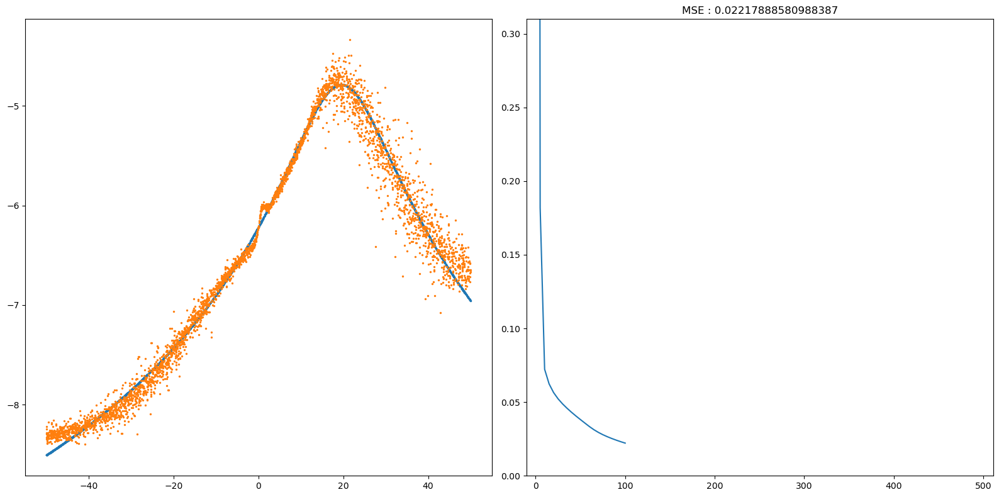

Epoch : 105 | MSE : 0.021280742982470294


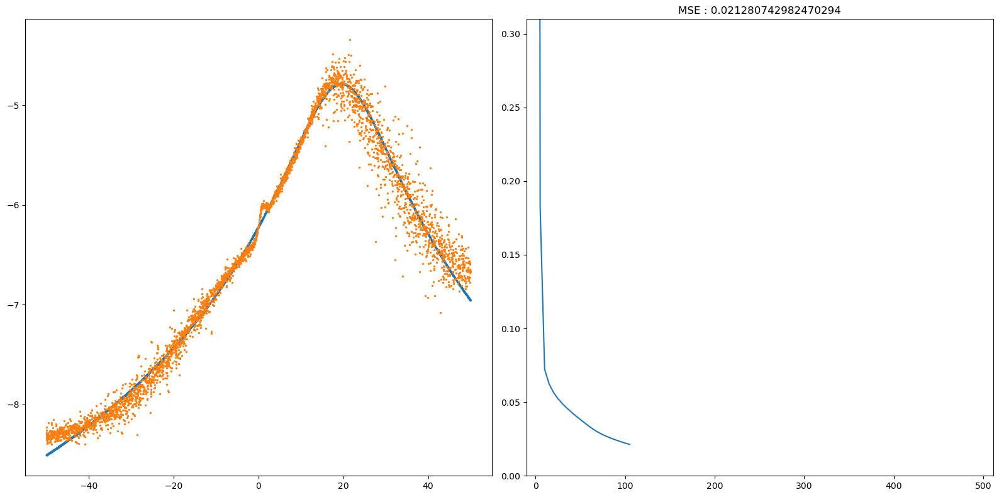

Epoch : 110 | MSE : 0.020447299207733968


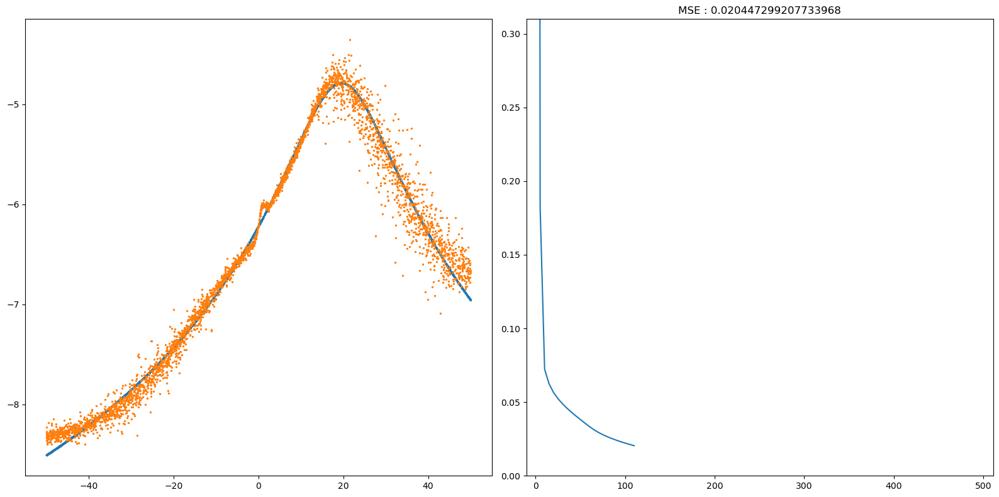

Epoch : 115 | MSE : 0.019675868921675235


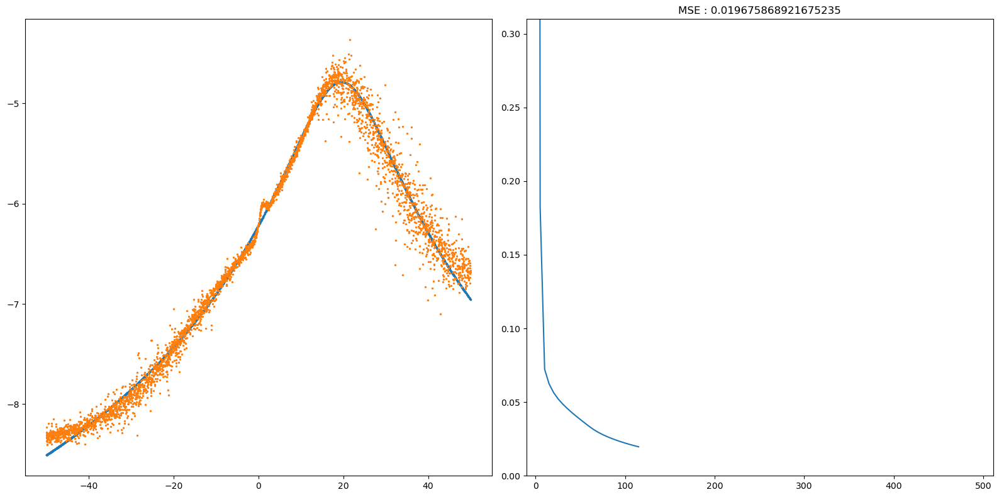

Epoch : 120 | MSE : 0.018952956124961513


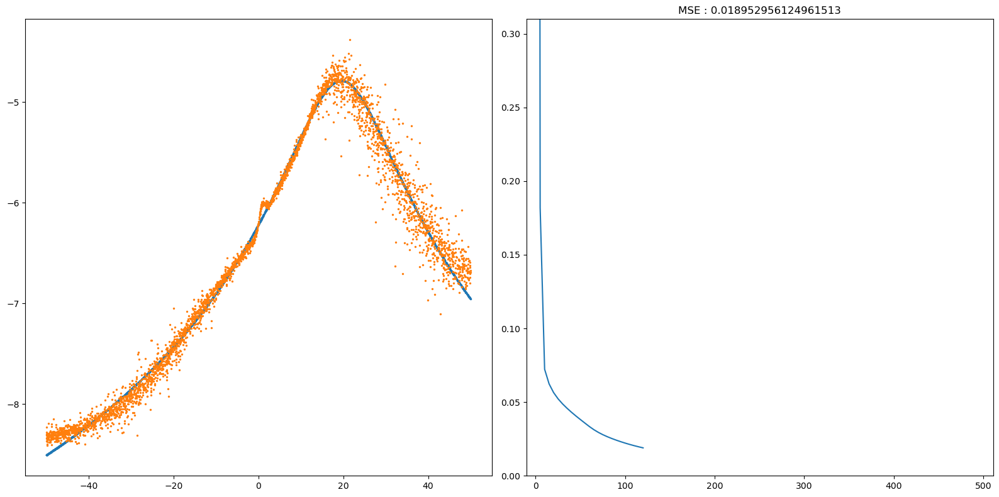

Epoch : 125 | MSE : 0.018253541318790856


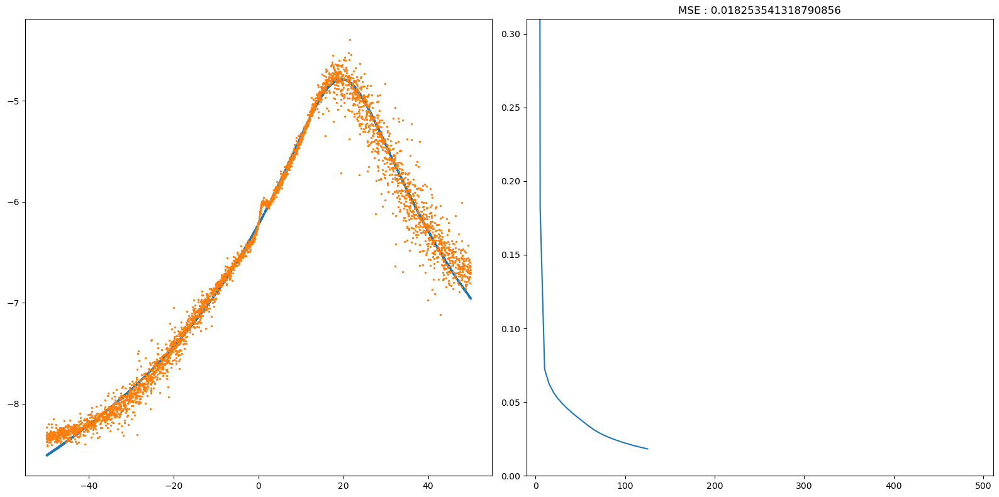

Epoch : 130 | MSE : 0.01755978821147213


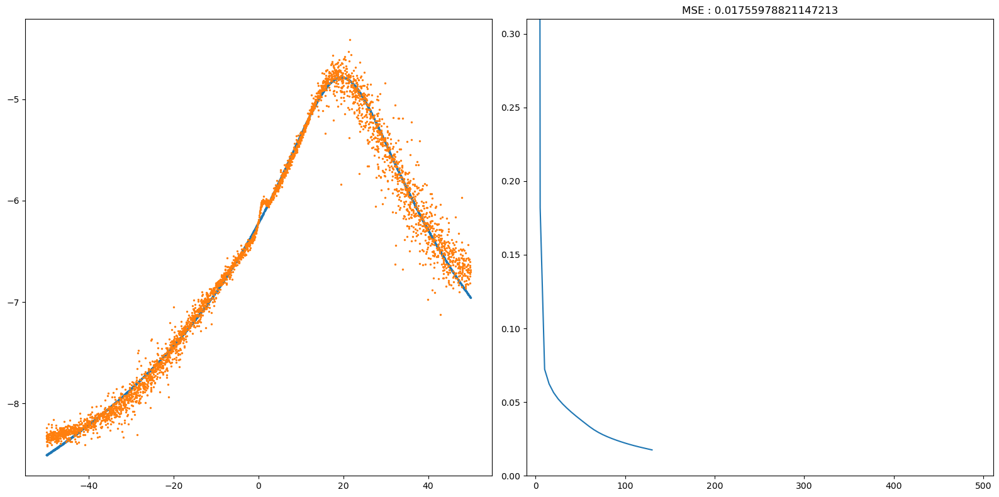

Epoch : 135 | MSE : 0.016863685163872738


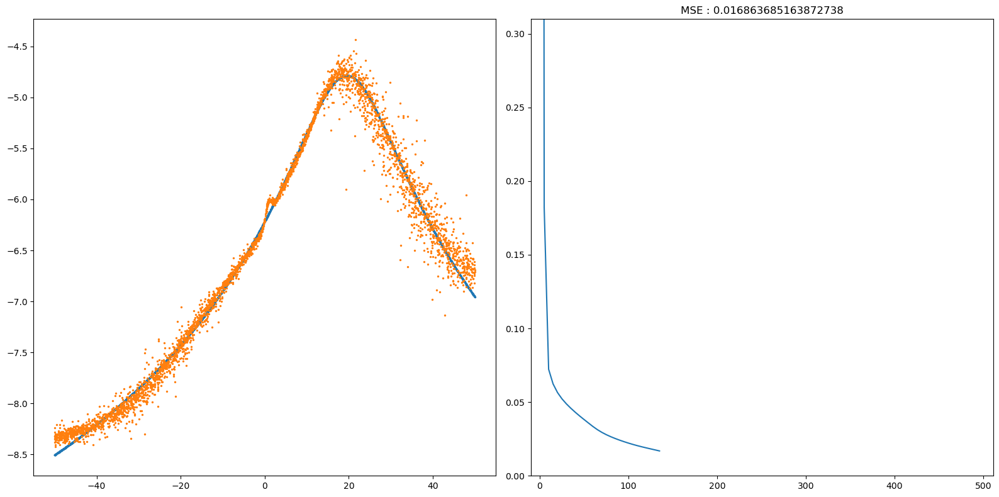

Epoch : 140 | MSE : 0.016165145425094656


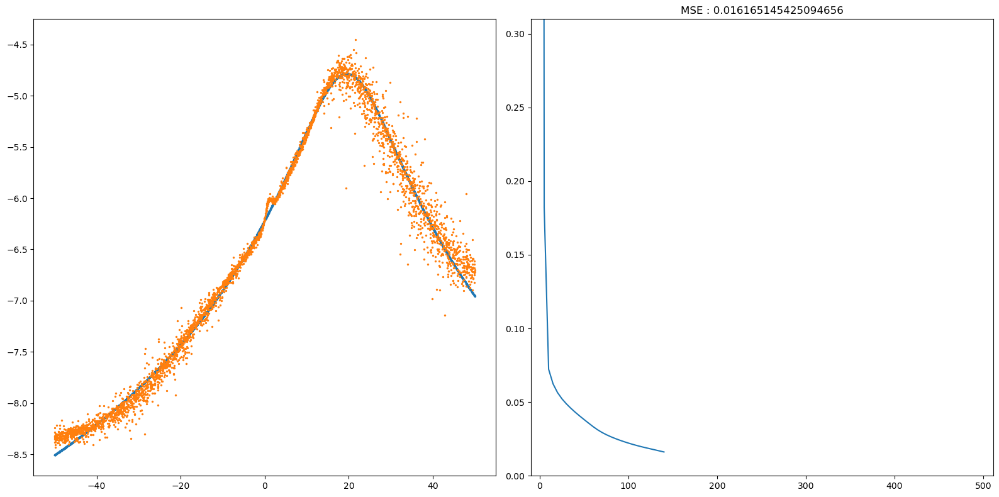

Epoch : 145 | MSE : 0.015471802946539855


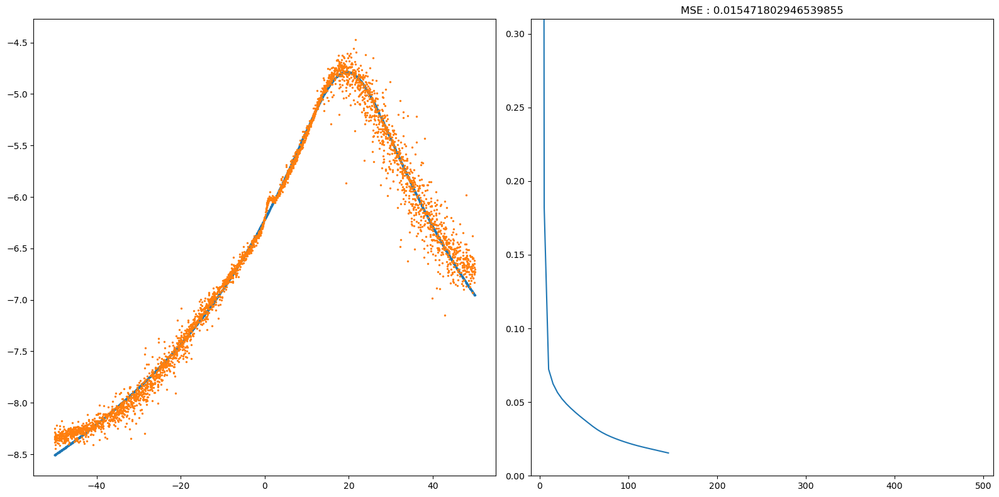

Epoch : 150 | MSE : 0.014790629198105802


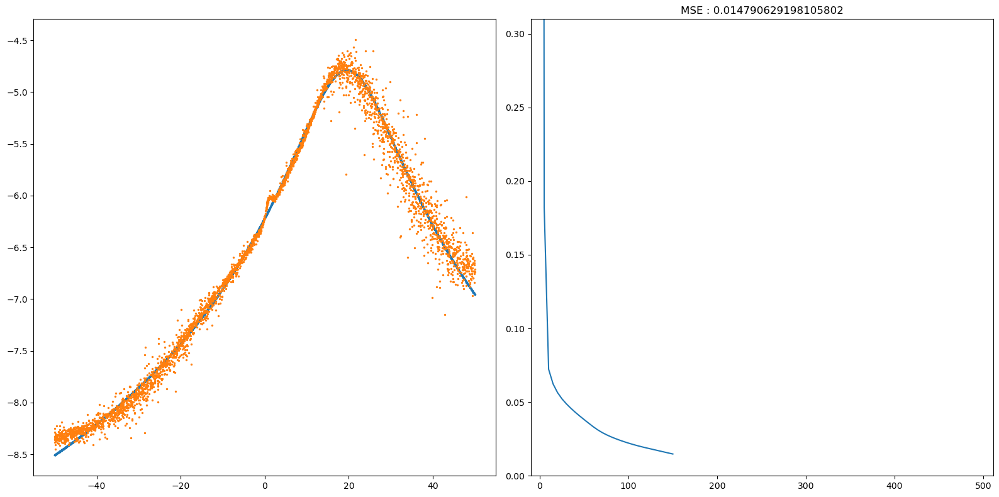

Epoch : 155 | MSE : 0.014124618768622829


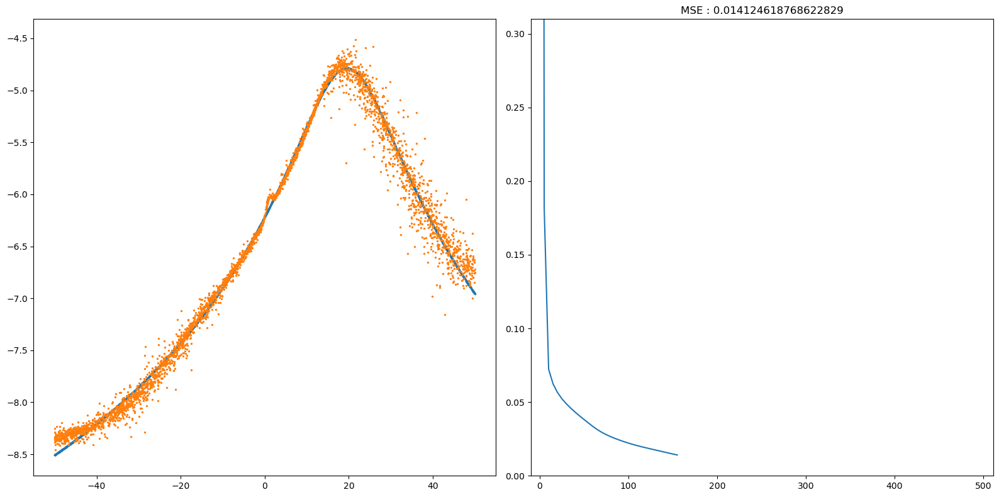

Epoch : 160 | MSE : 0.013478833621498642


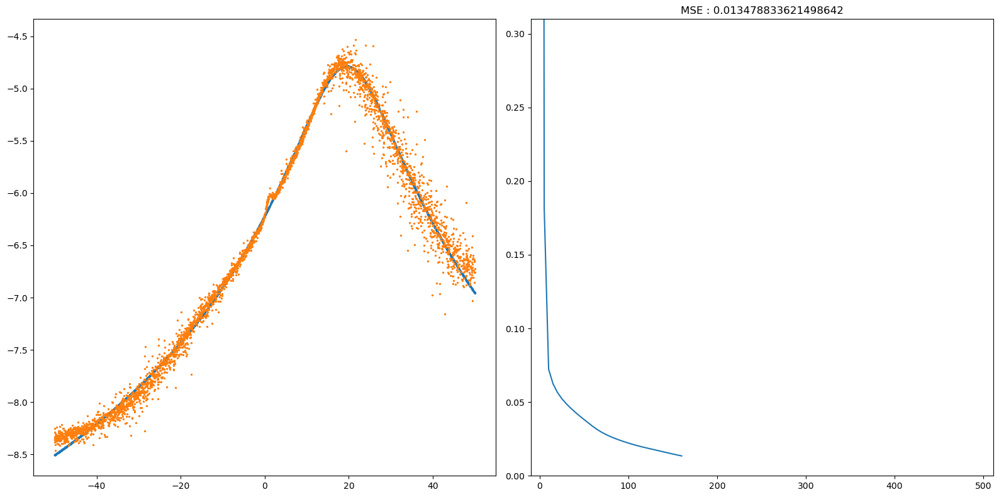

Epoch : 165 | MSE : 0.01286097569109582


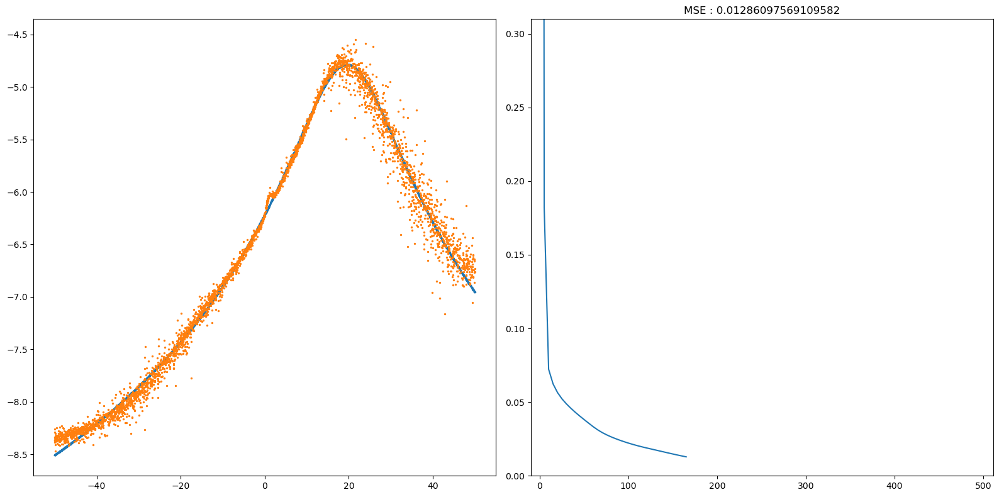

Epoch : 170 | MSE : 0.012272555711020077


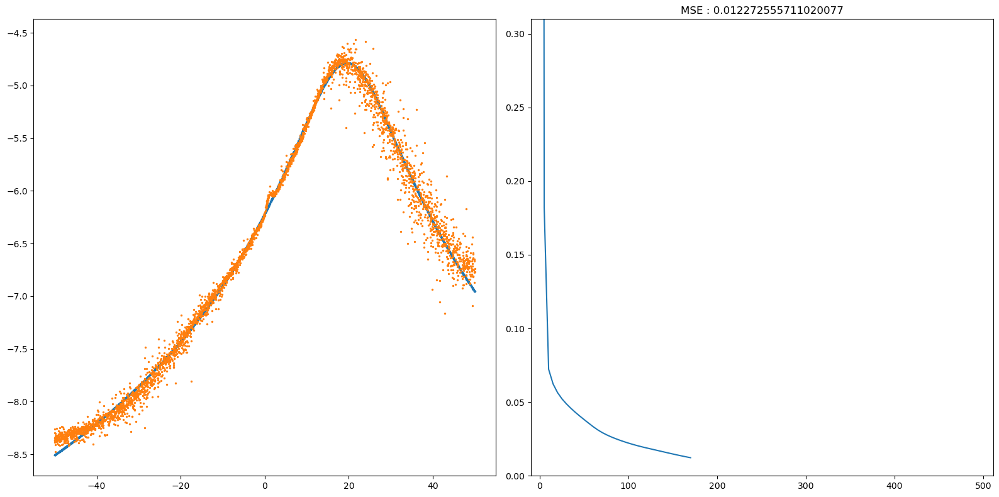

Epoch : 175 | MSE : 0.011713847184374657


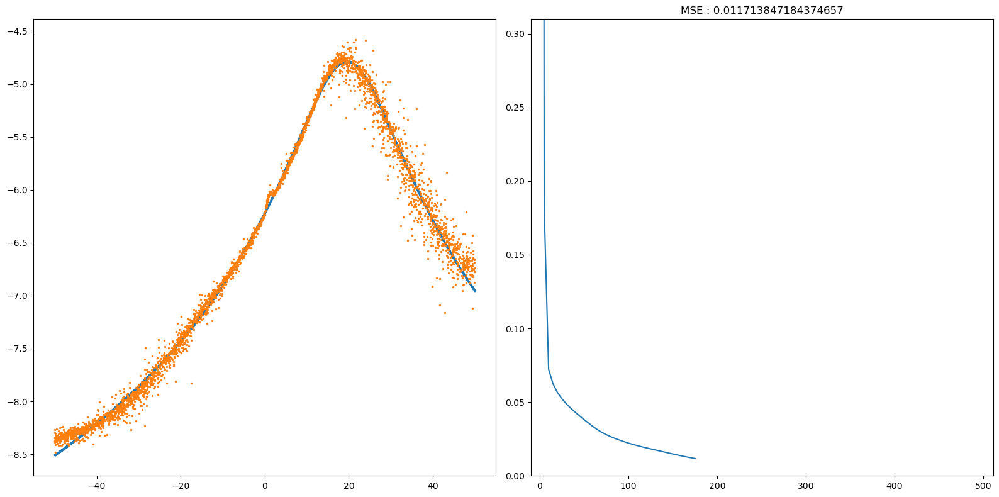

Epoch : 180 | MSE : 0.011182106165423387


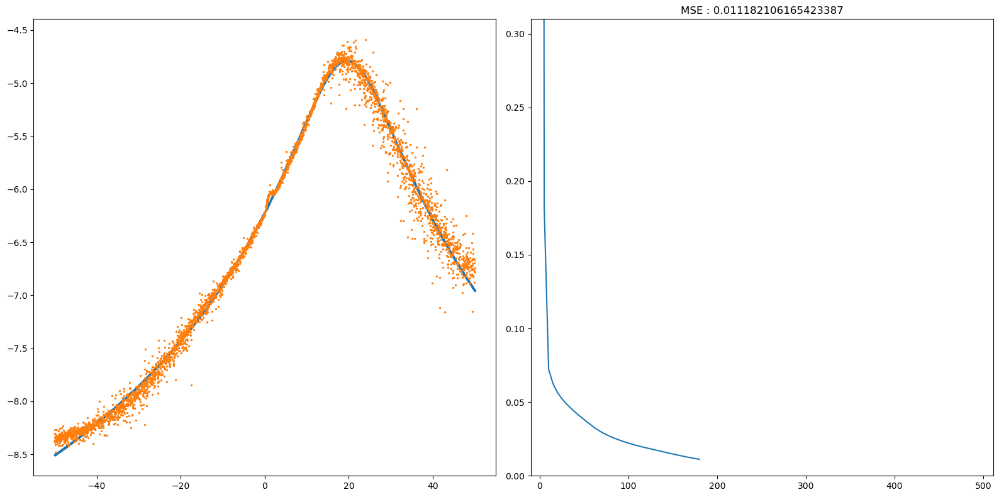

Epoch : 185 | MSE : 0.010665063274485399


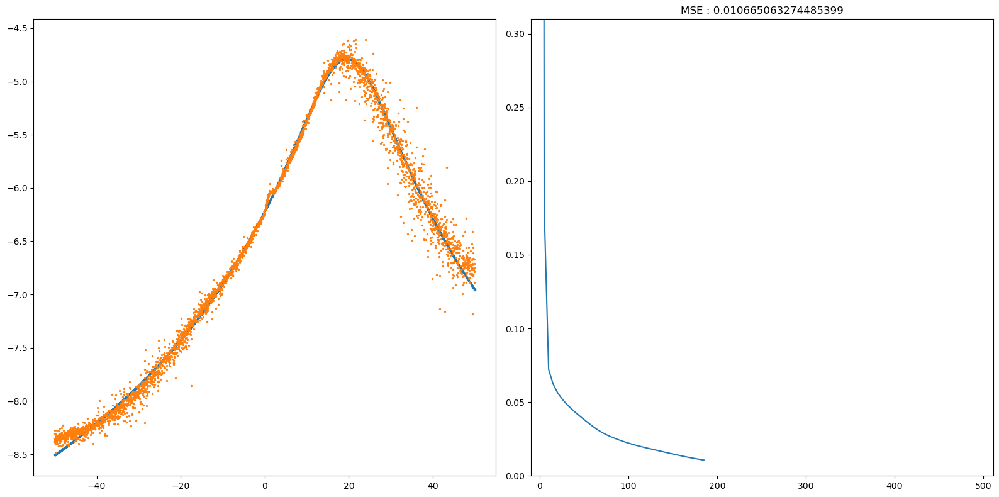

Epoch : 190 | MSE : 0.010165688191562827


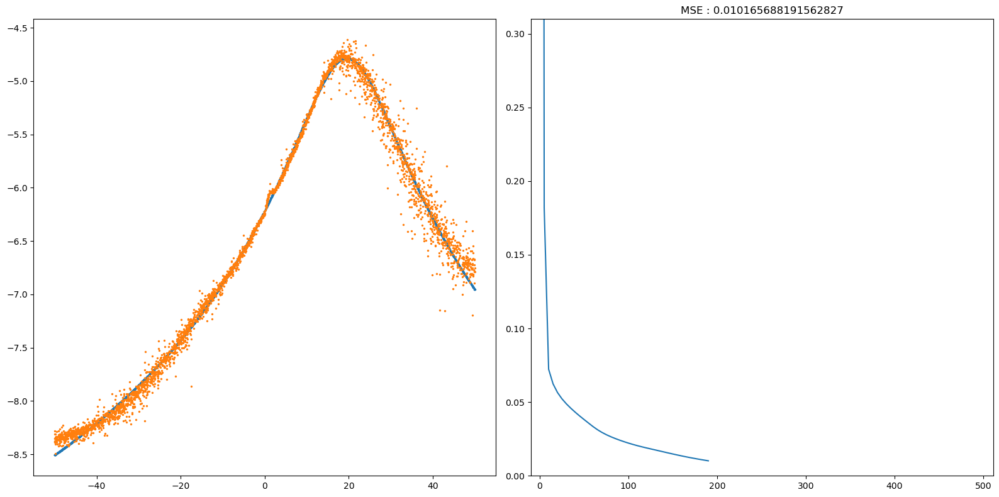

Epoch : 195 | MSE : 0.009744019111479115


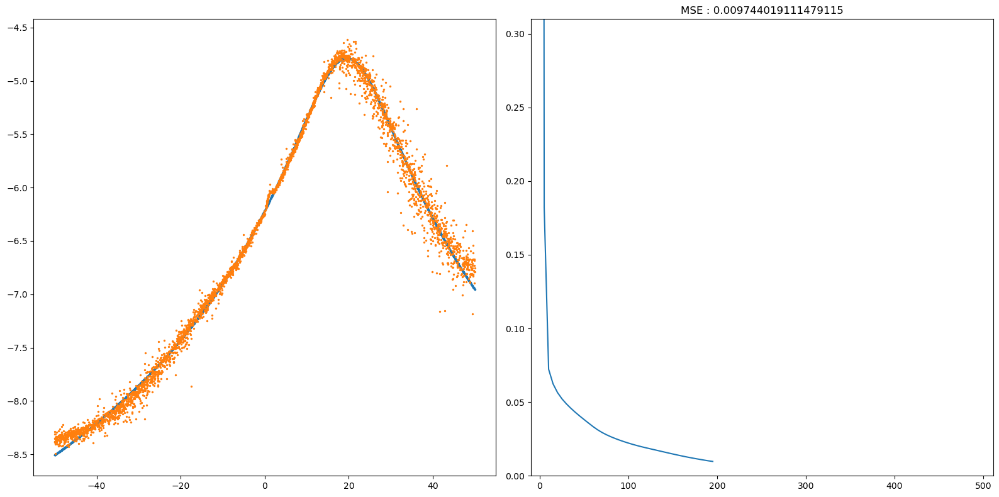

Epoch : 200 | MSE : 0.009432148278422457


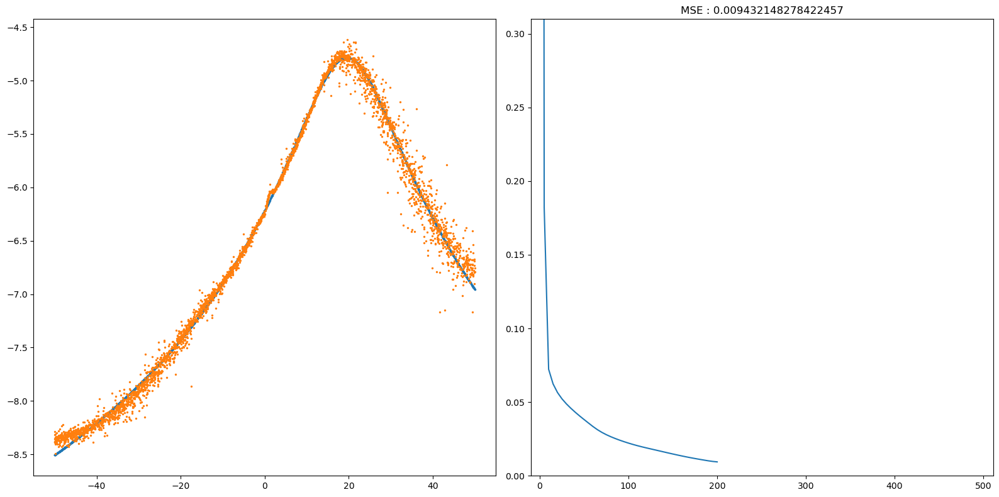

Epoch : 205 | MSE : 0.00920277781598557


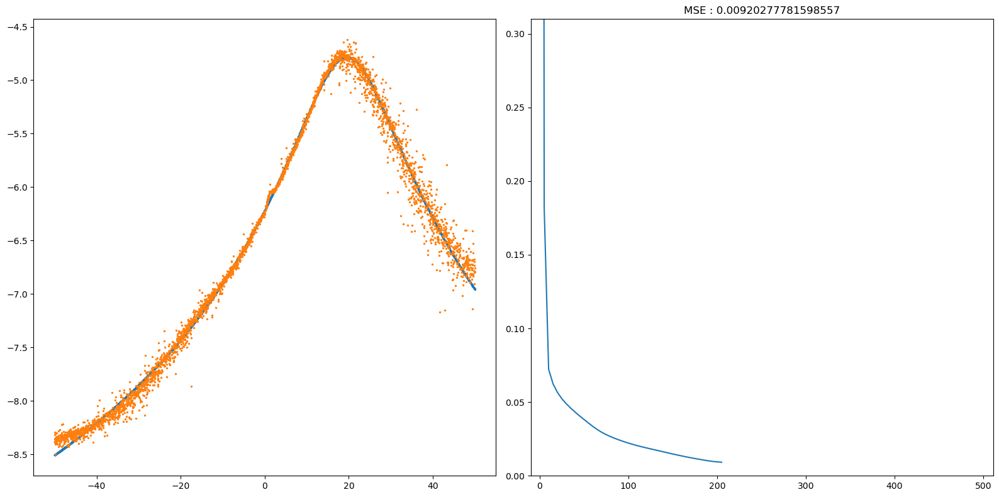

Epoch : 210 | MSE : 0.009008327164474257


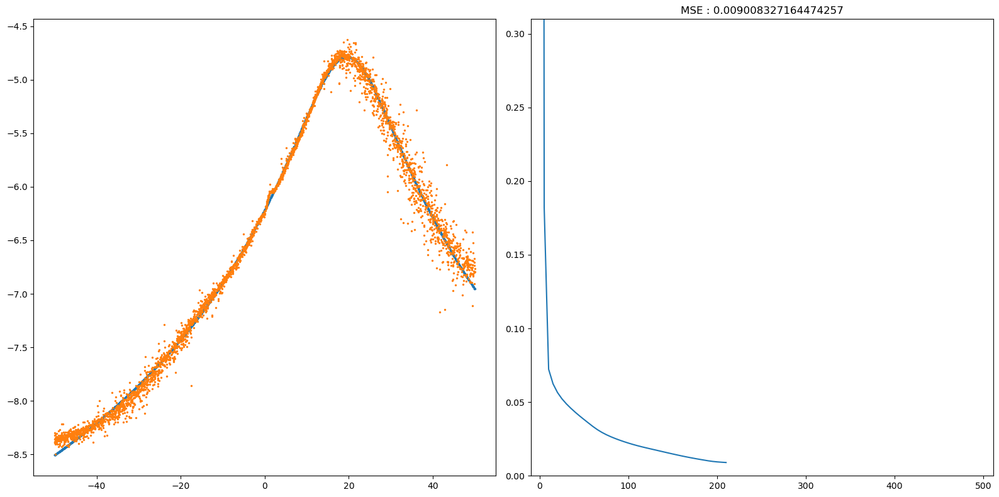

Epoch : 215 | MSE : 0.008820811312781684


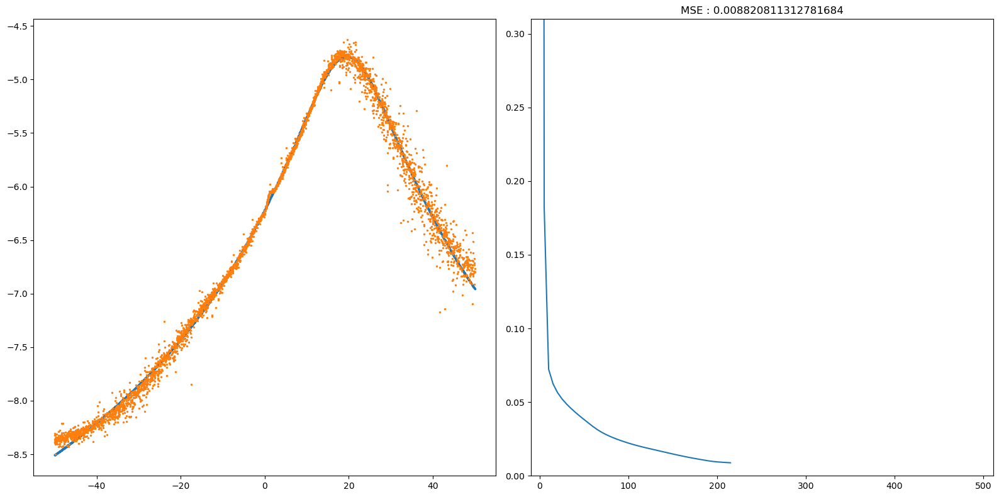

Epoch : 220 | MSE : 0.008631326447808835


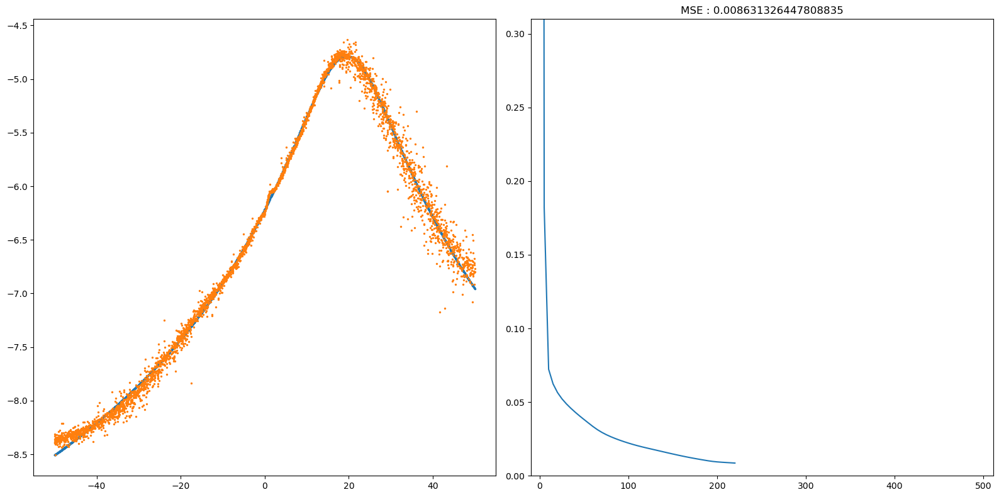

Epoch : 225 | MSE : 0.008438982921579454


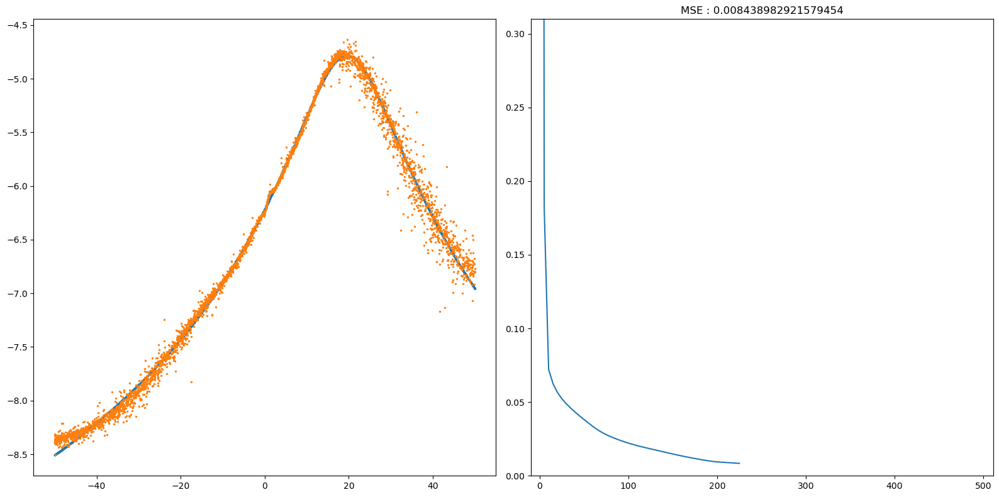

Epoch : 230 | MSE : 0.008245042085363644


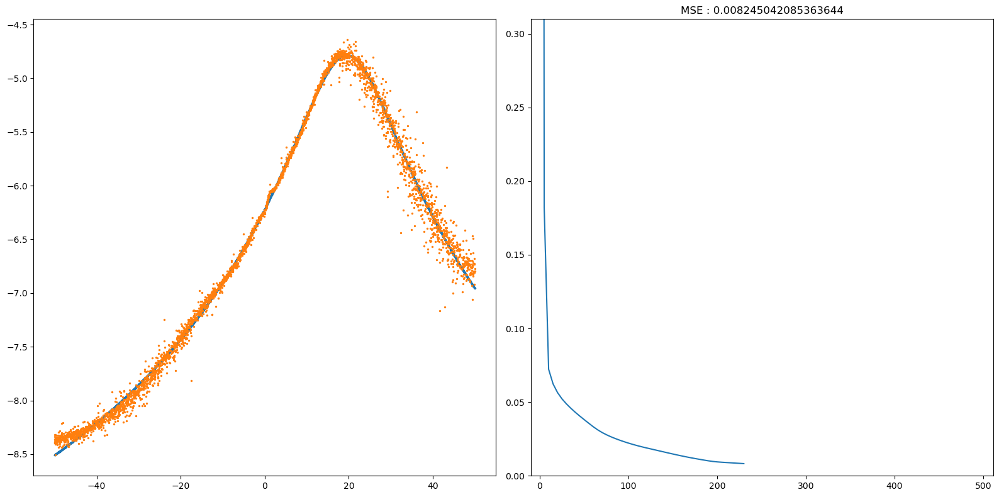

Epoch : 235 | MSE : 0.00805123275614167


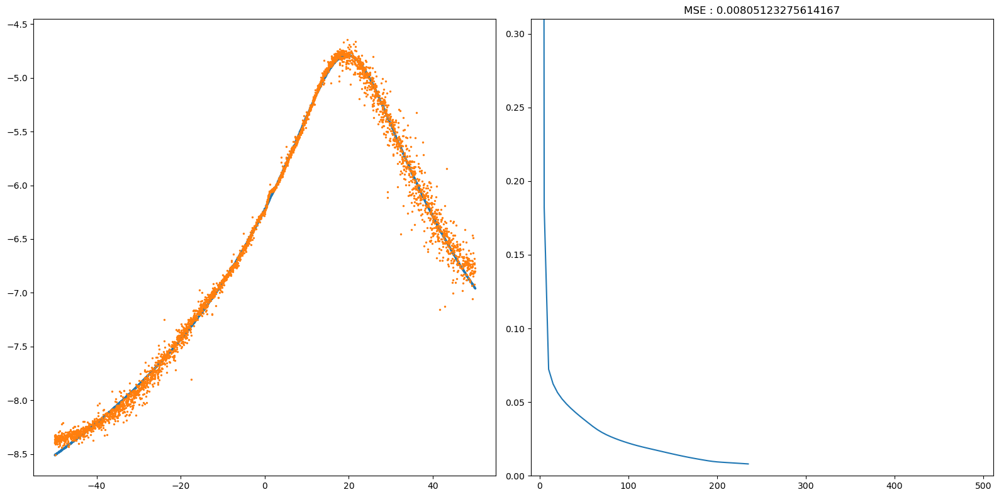

Epoch : 240 | MSE : 0.007860032485682856


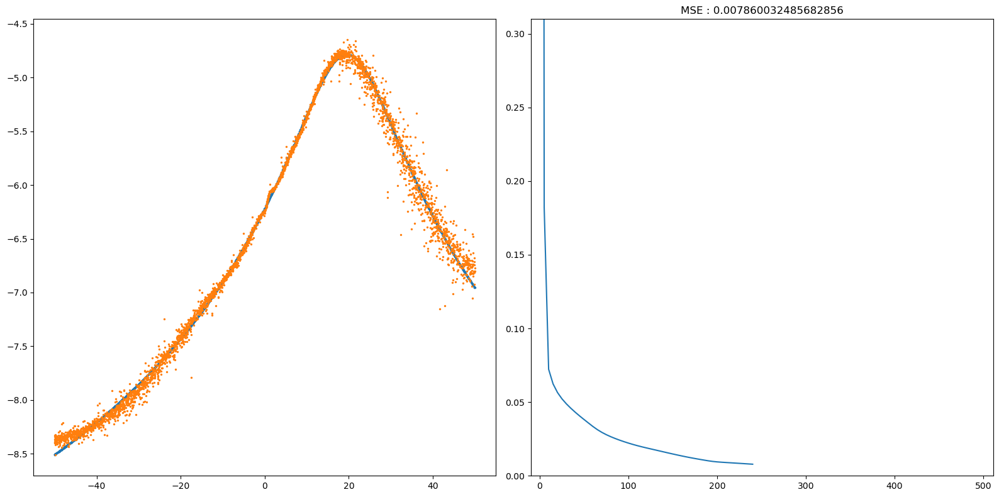

Epoch : 245 | MSE : 0.007675167824794654


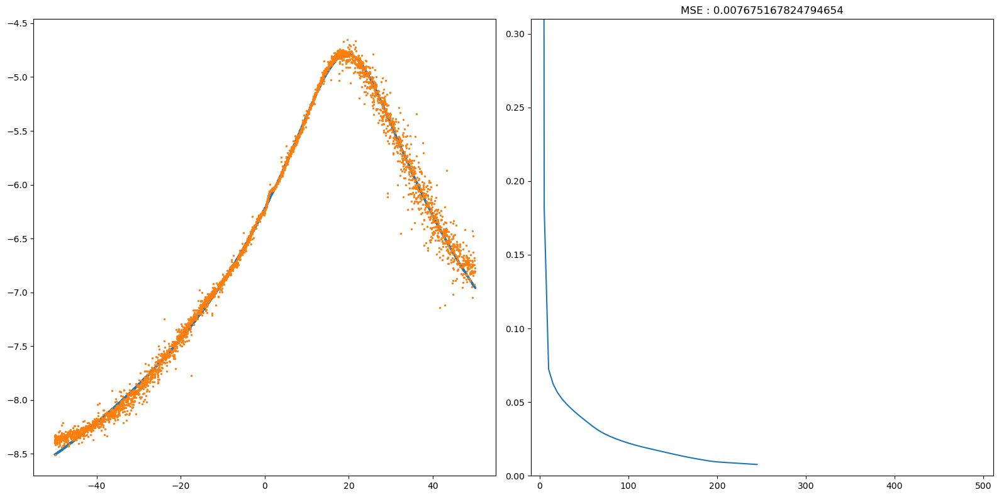

Epoch : 250 | MSE : 0.007500716754241069


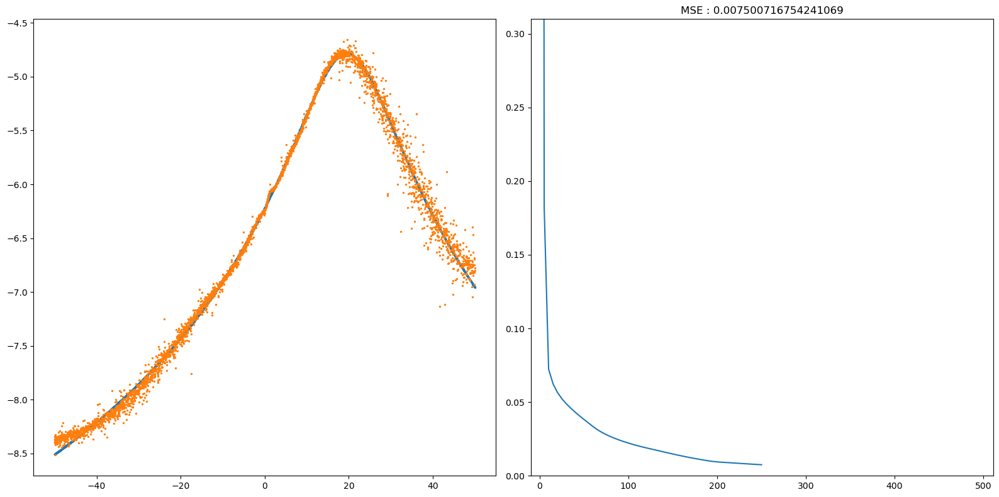

Epoch : 255 | MSE : 0.007337976888177917


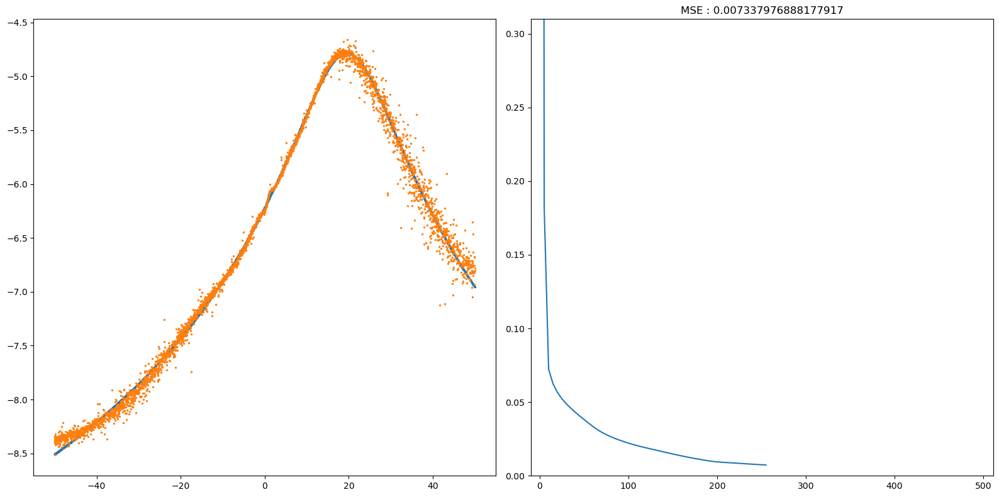

Epoch : 260 | MSE : 0.0071836395104774384


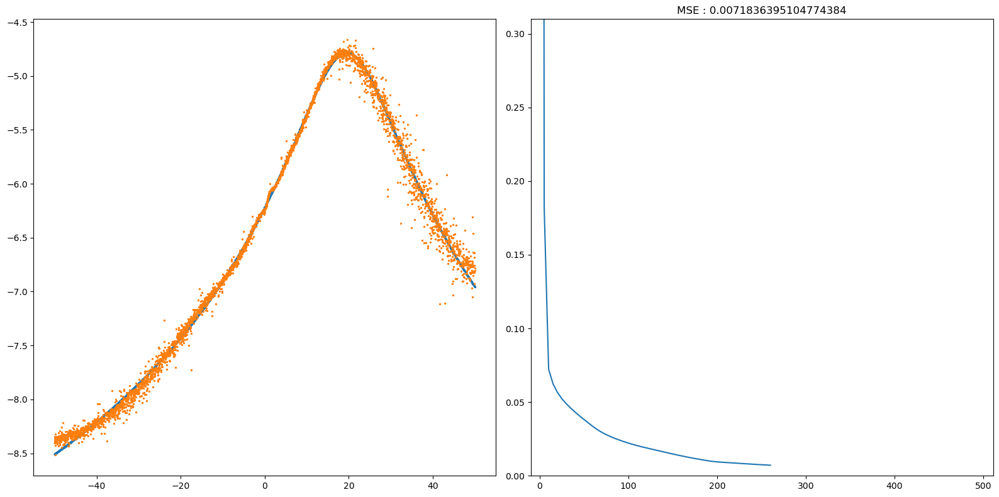

Epoch : 265 | MSE : 0.007035431180363652


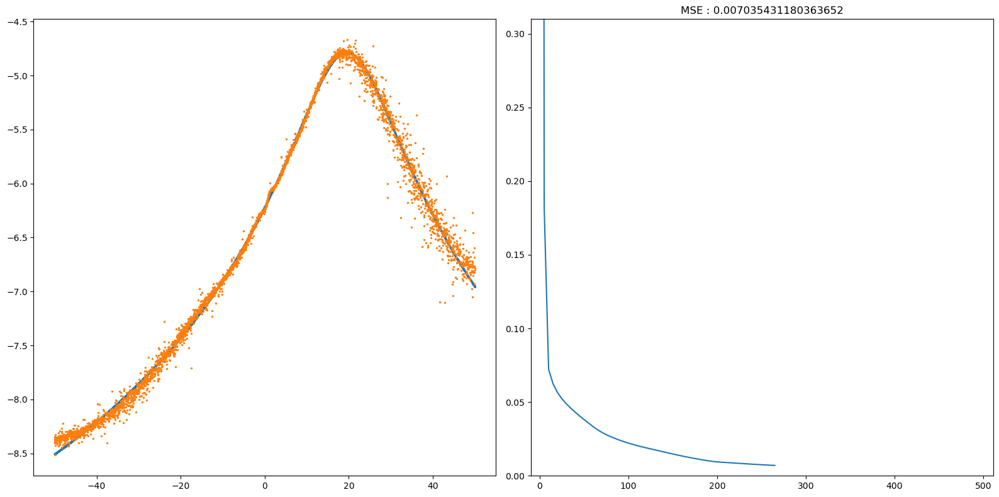

Epoch : 270 | MSE : 0.0069010047853704445


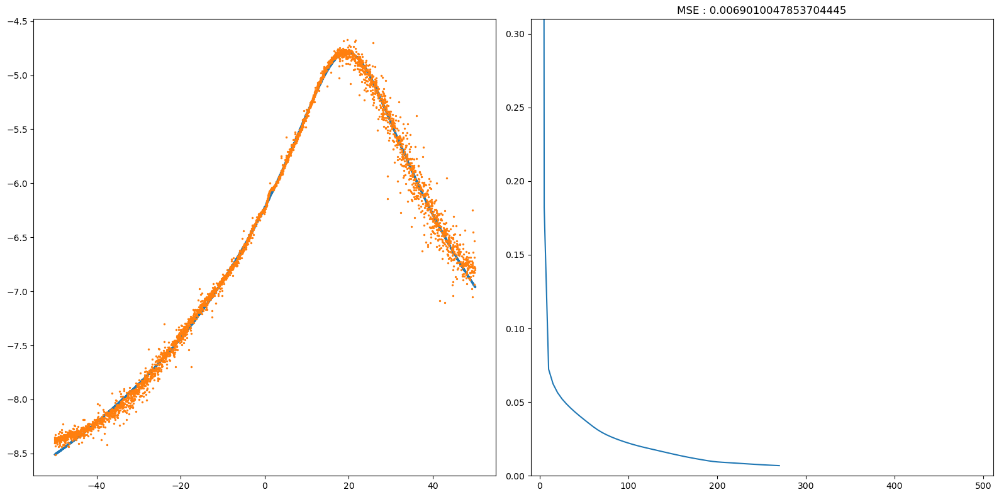

Epoch : 275 | MSE : 0.006798558624112976


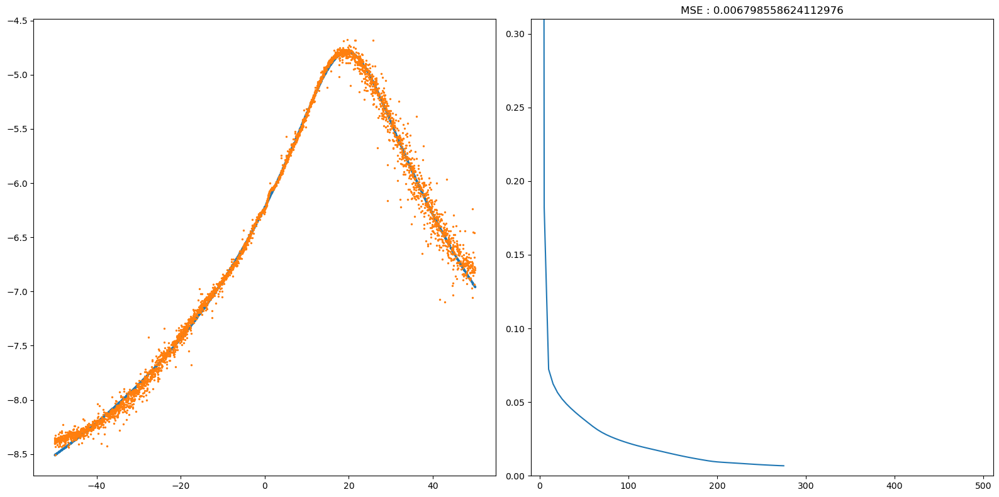

Epoch : 280 | MSE : 0.0067327773700717524


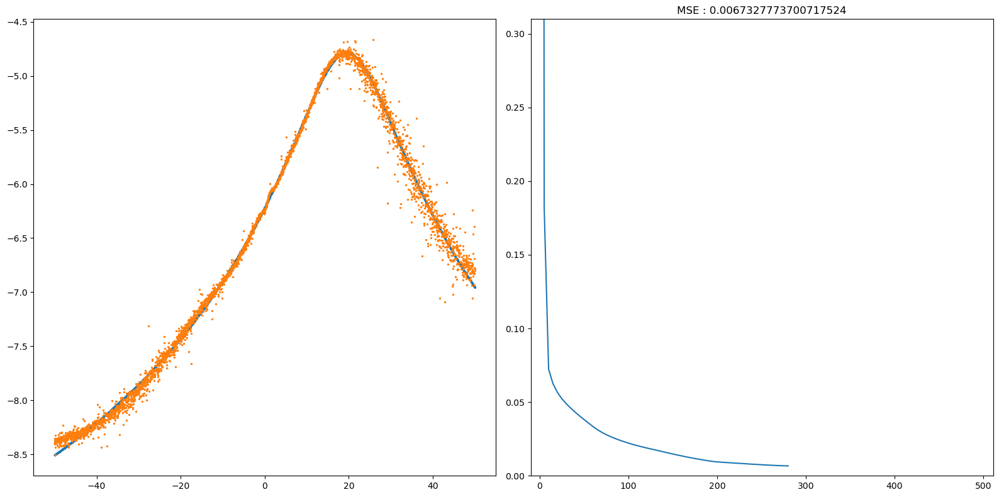

Epoch : 285 | MSE : 0.006682805542562335


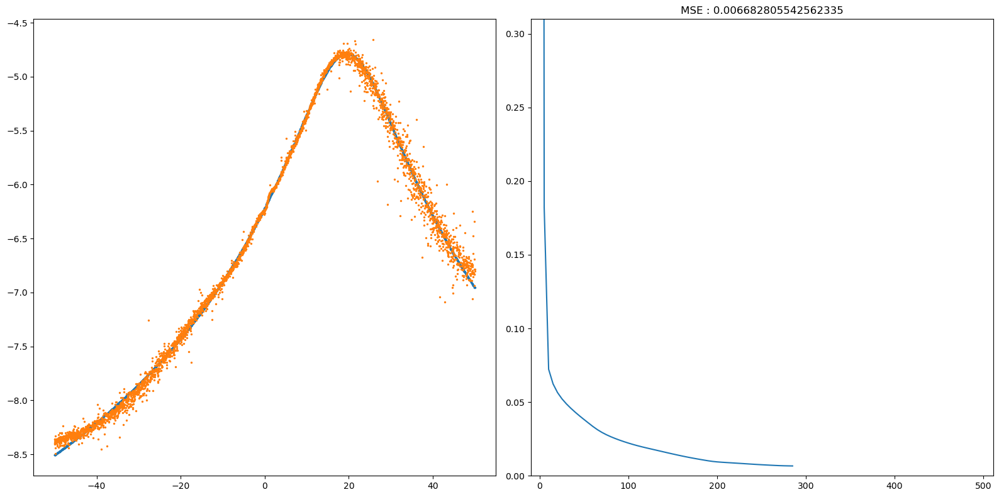

Epoch : 290 | MSE : 0.006632889090813623


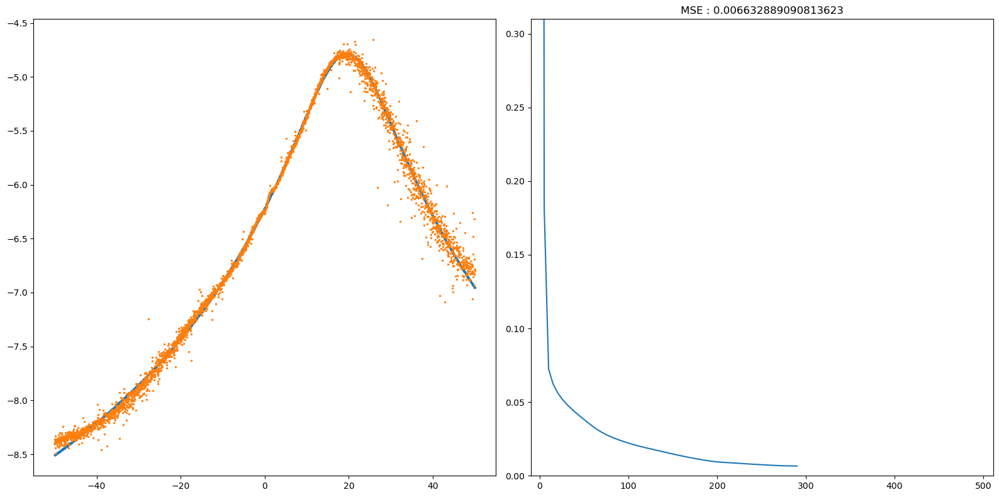

Epoch : 295 | MSE : 0.006578589221912905


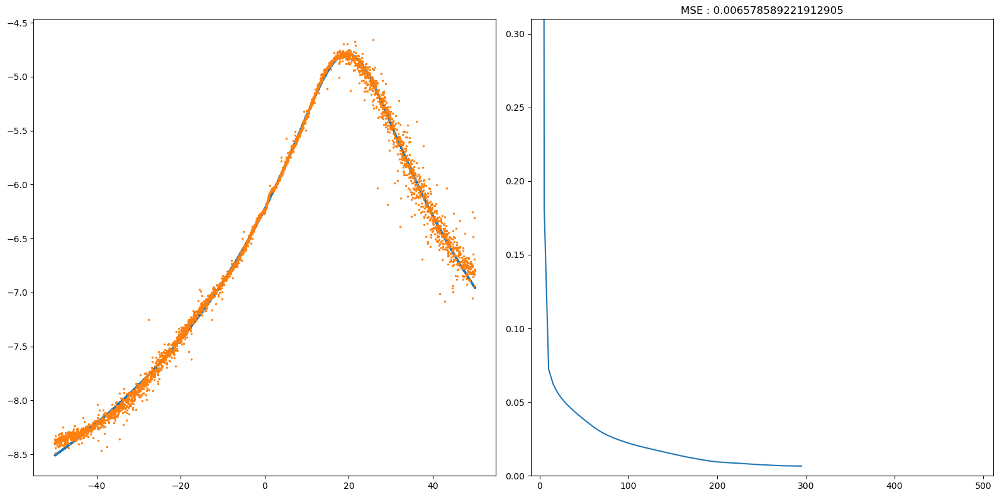

Epoch : 300 | MSE : 0.0065200981923650096


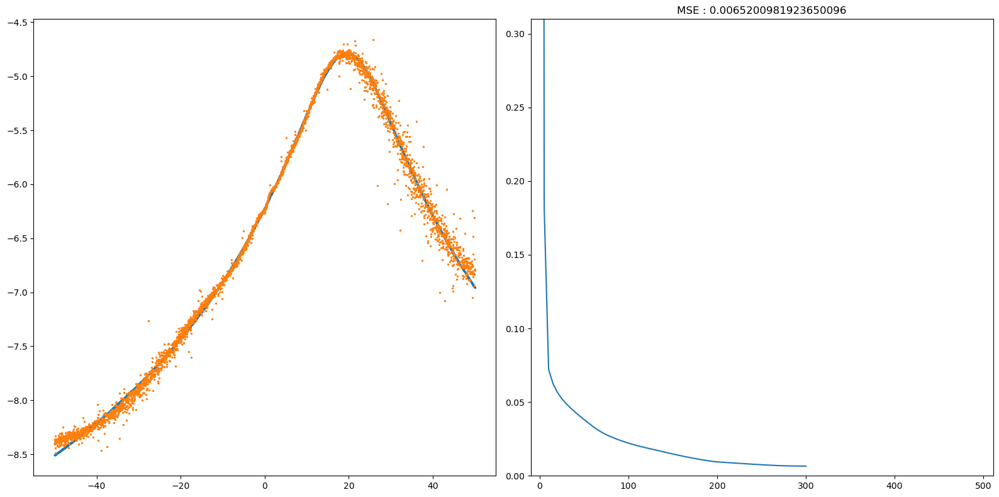

Epoch : 305 | MSE : 0.006455021203302802


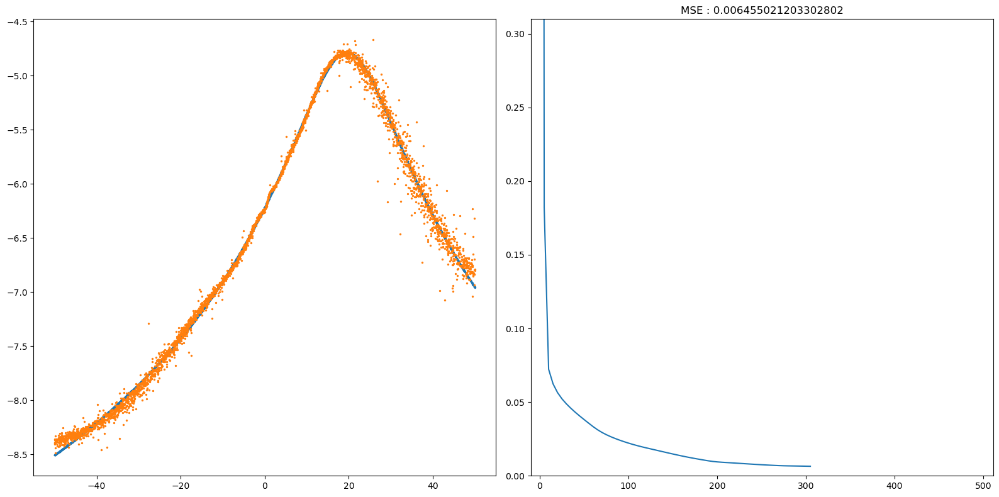

Epoch : 310 | MSE : 0.006382973953535724


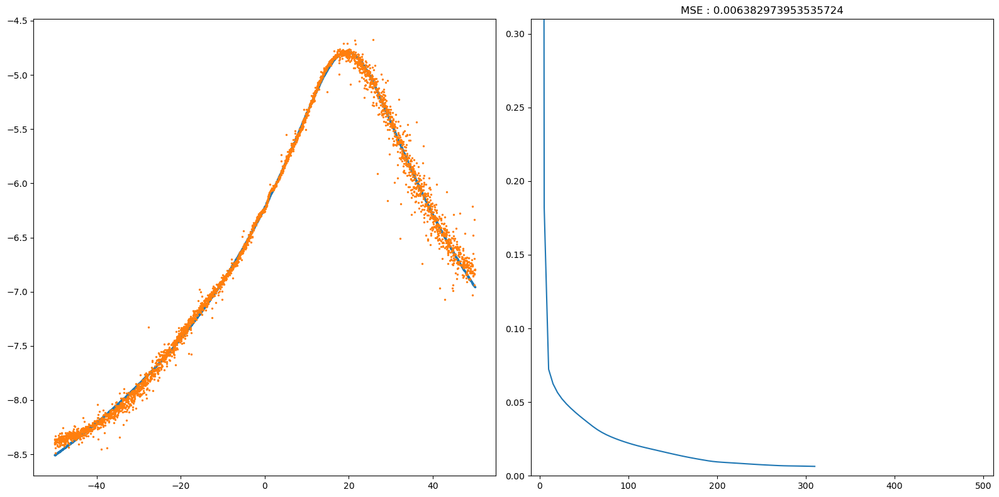

Epoch : 315 | MSE : 0.00630699021877297


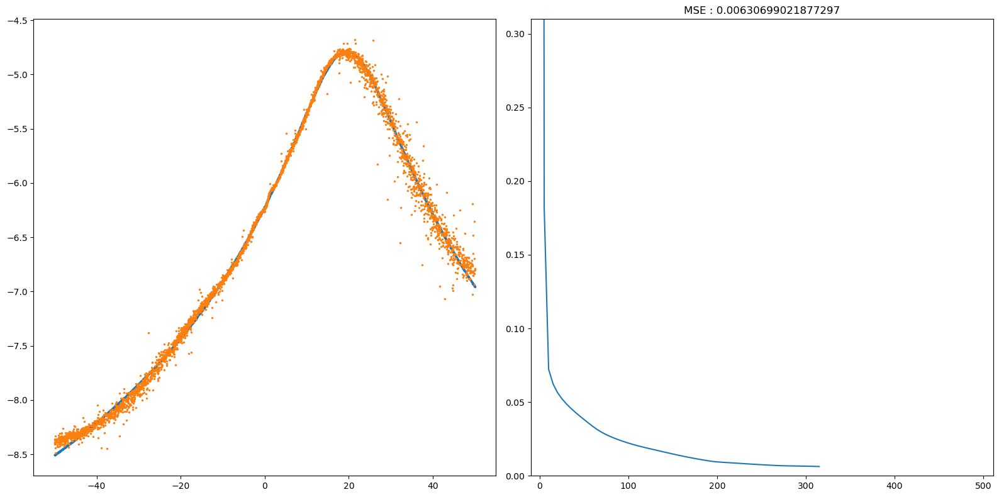

Epoch : 320 | MSE : 0.006231325358856753


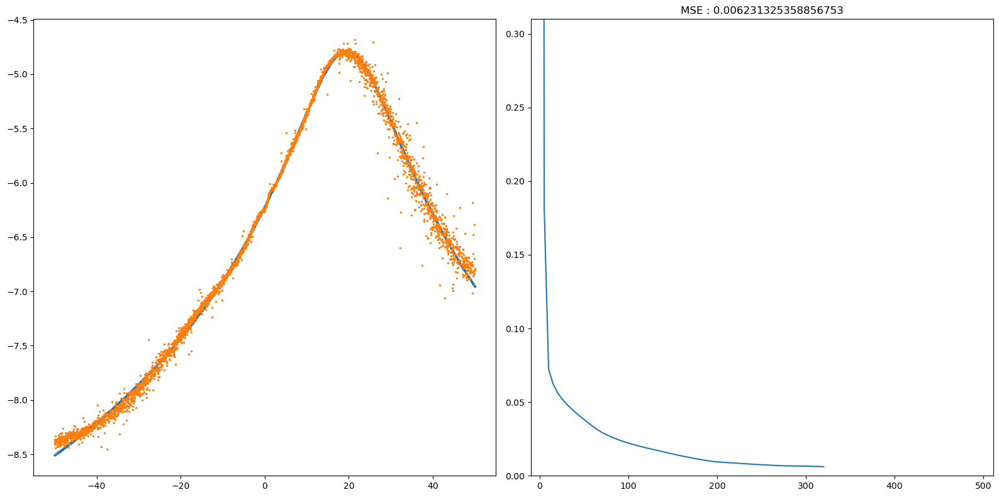

Epoch : 325 | MSE : 0.006159743687799297


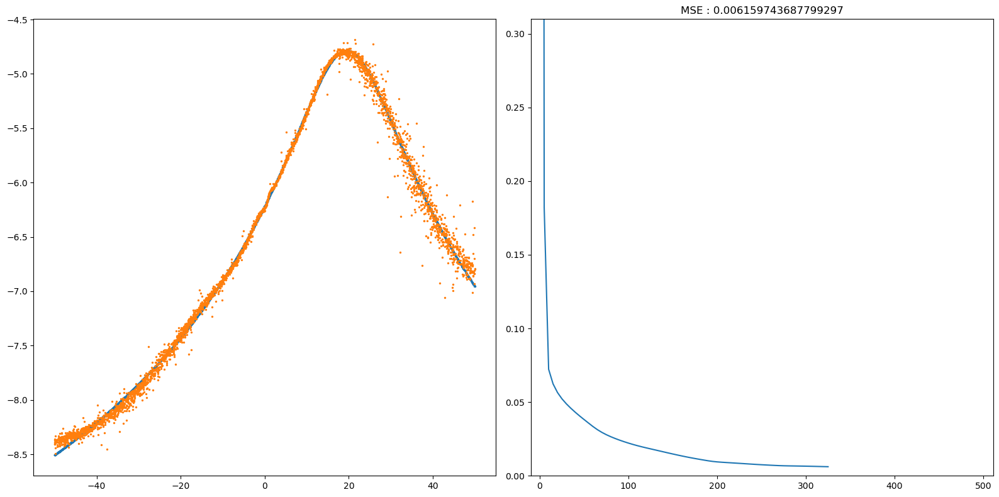

Epoch : 330 | MSE : 0.006094481573063003


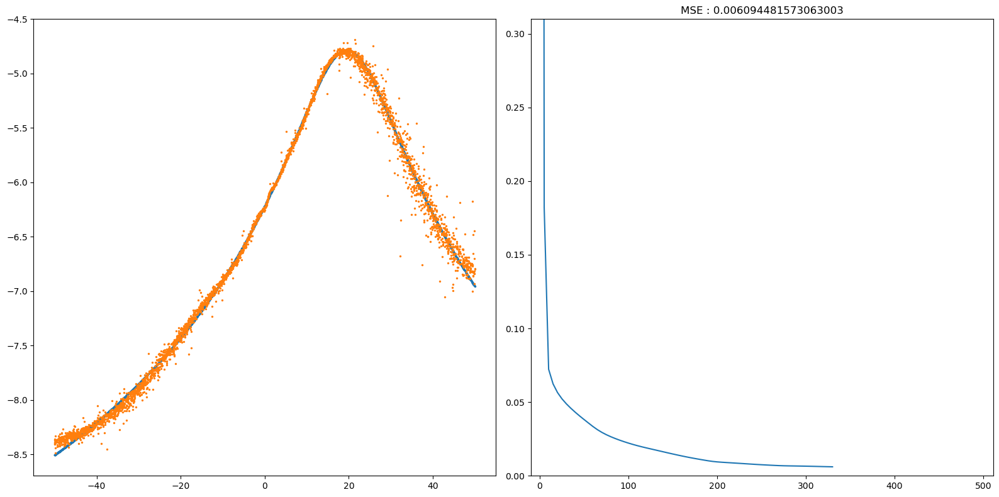

Epoch : 335 | MSE : 0.006035541175357446


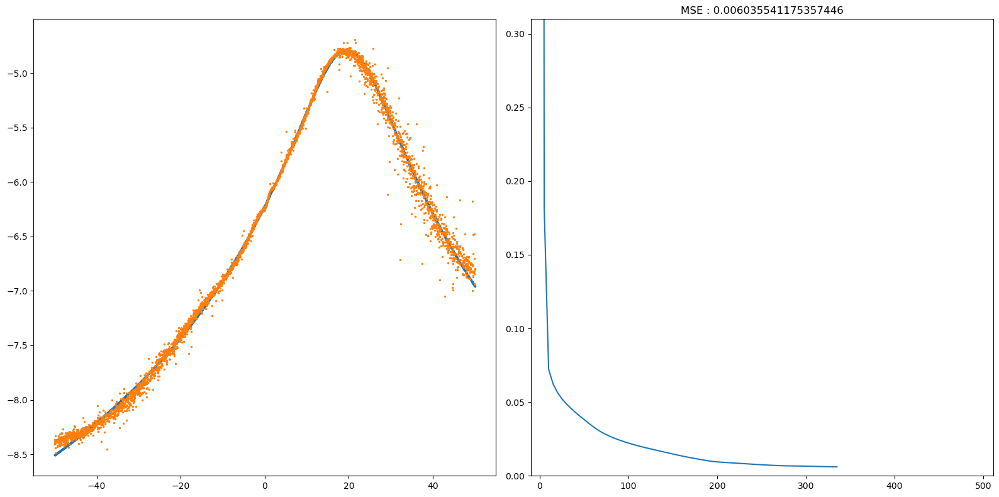

Epoch : 340 | MSE : 0.005981444322583661


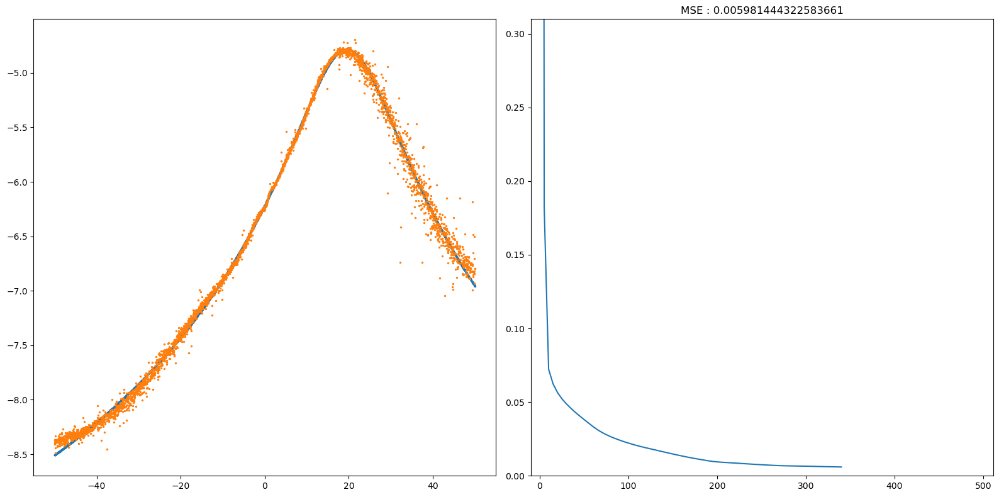

Epoch : 345 | MSE : 0.005930597754531019


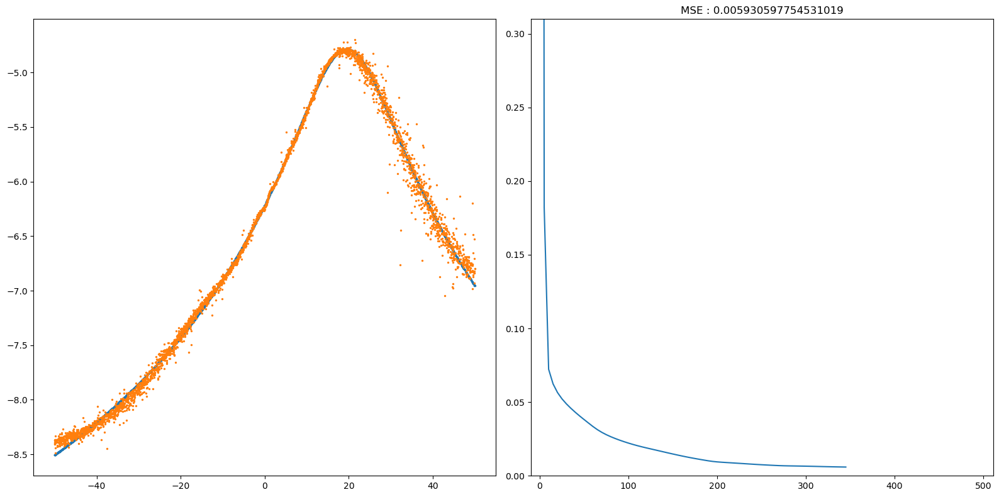

Epoch : 350 | MSE : 0.005881910563739376


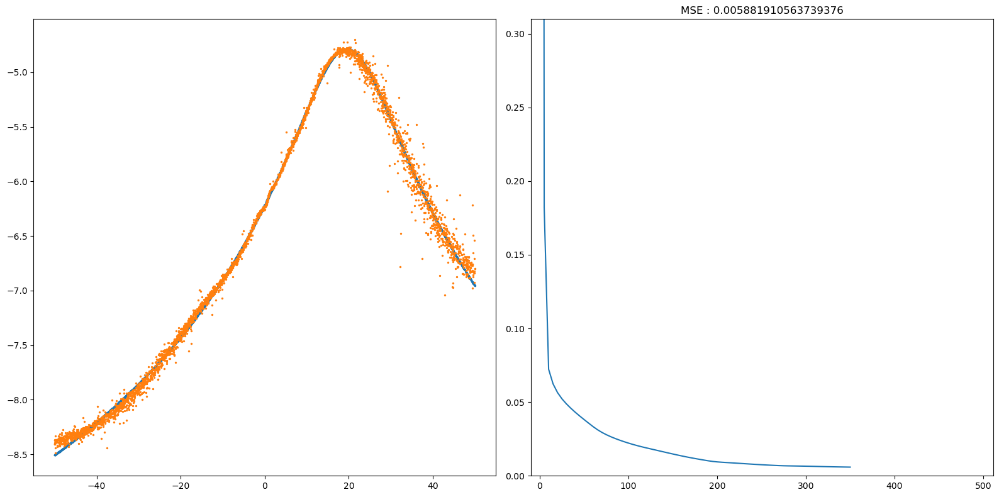

Epoch : 355 | MSE : 0.005834759835743983


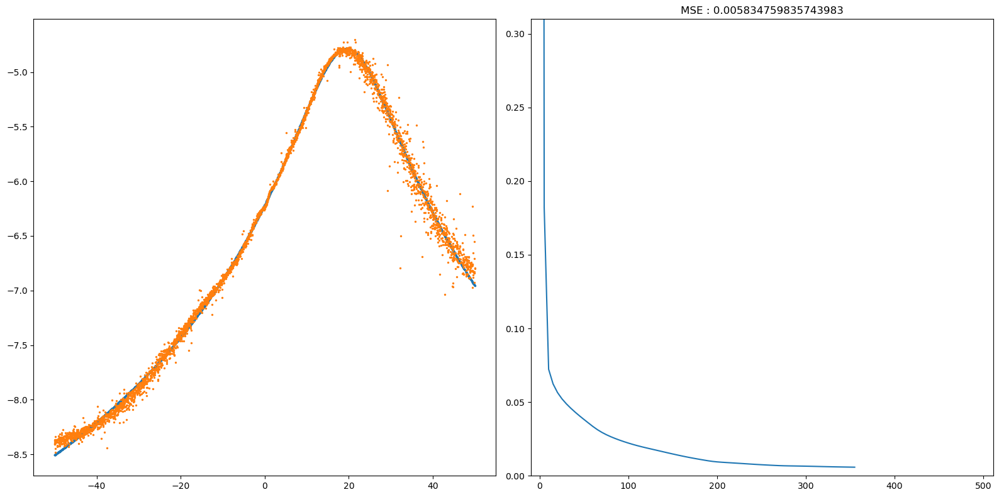

Epoch : 360 | MSE : 0.0057888055378342565


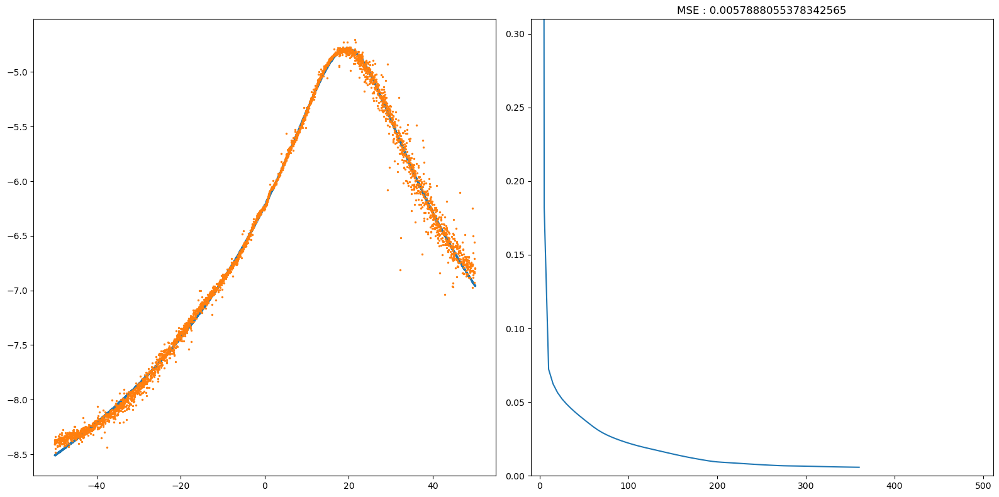

Epoch : 365 | MSE : 0.005743857111117508


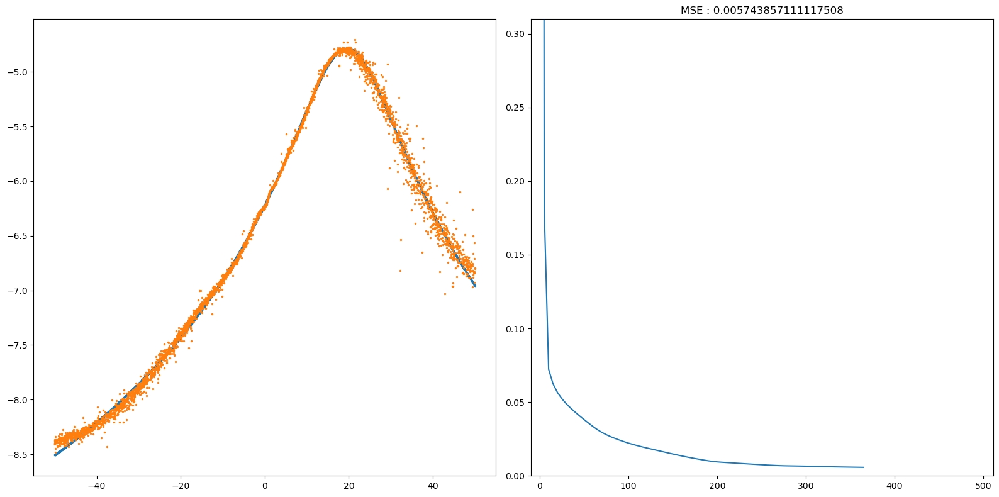

Epoch : 370 | MSE : 0.005699805318843454


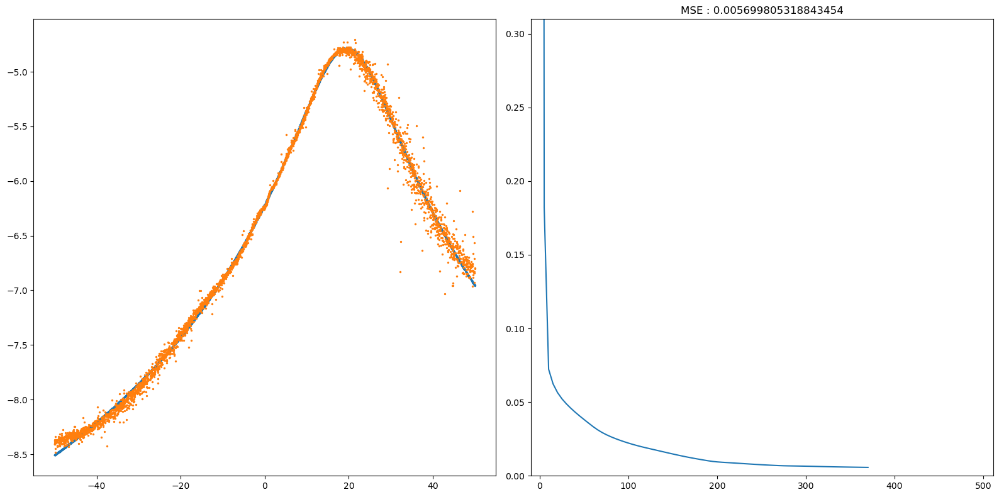

Epoch : 375 | MSE : 0.005656590485268386


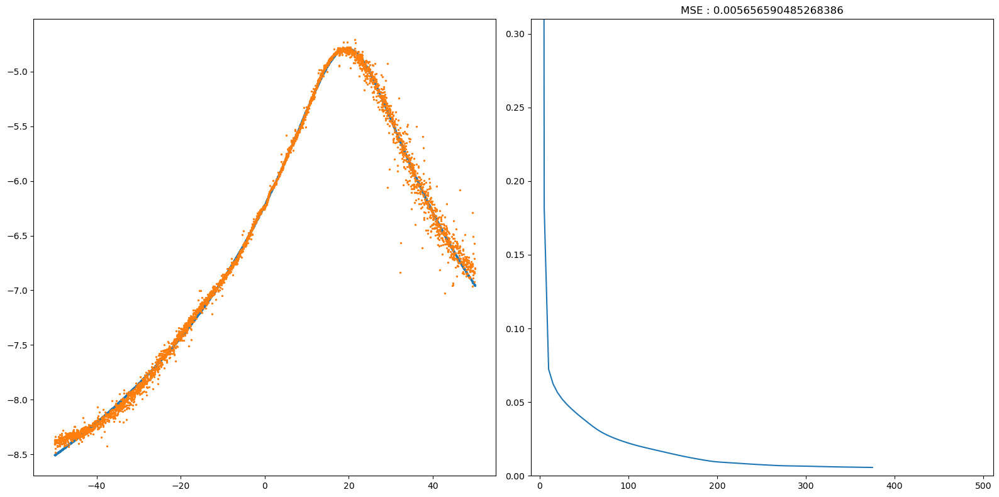

Epoch : 380 | MSE : 0.005614184201366608


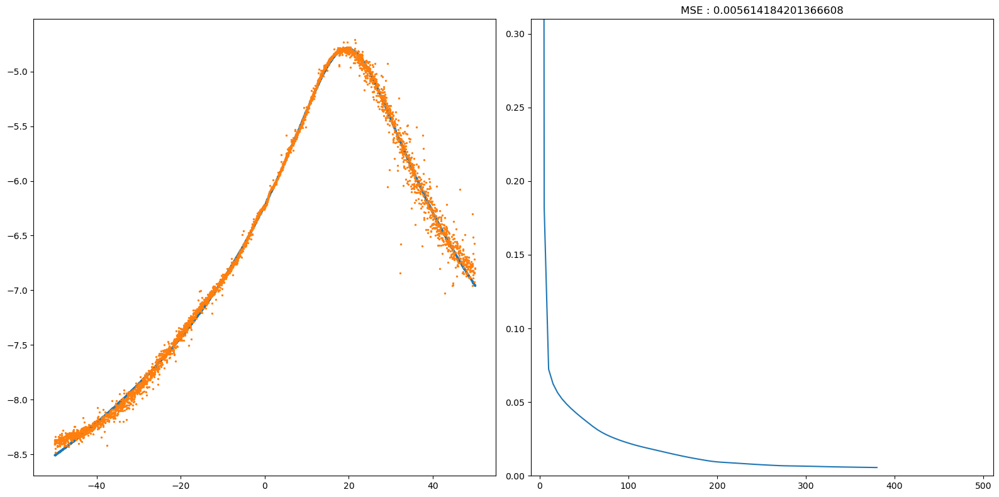

Epoch : 385 | MSE : 0.005572574831738379


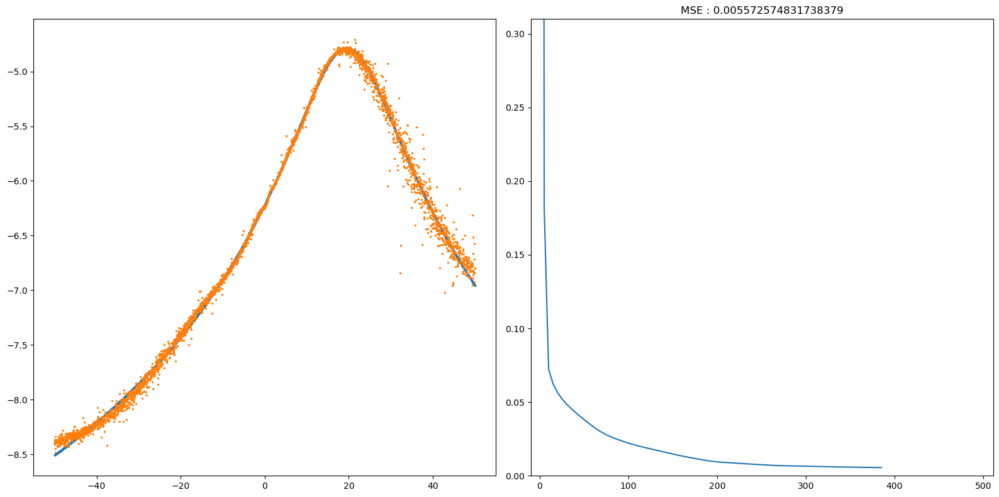

Epoch : 390 | MSE : 0.005531755639399882


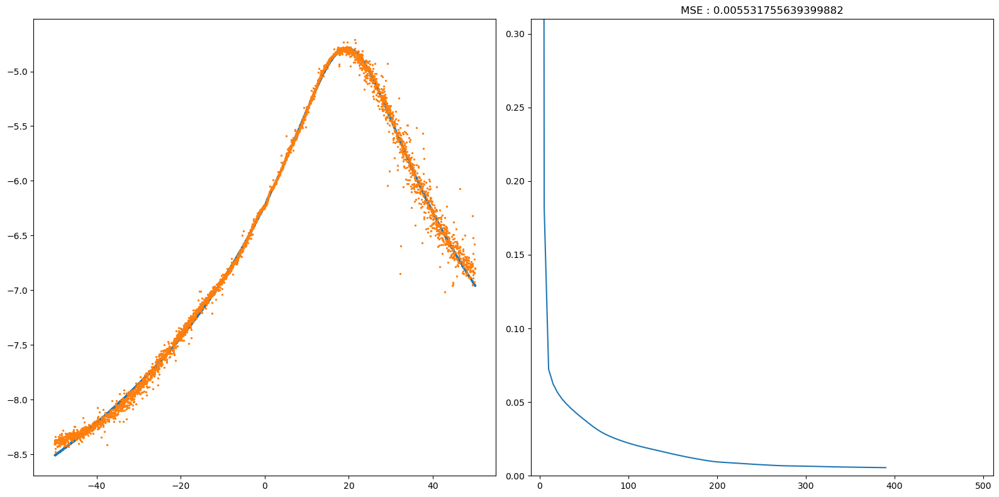

Epoch : 395 | MSE : 0.005491716765896962


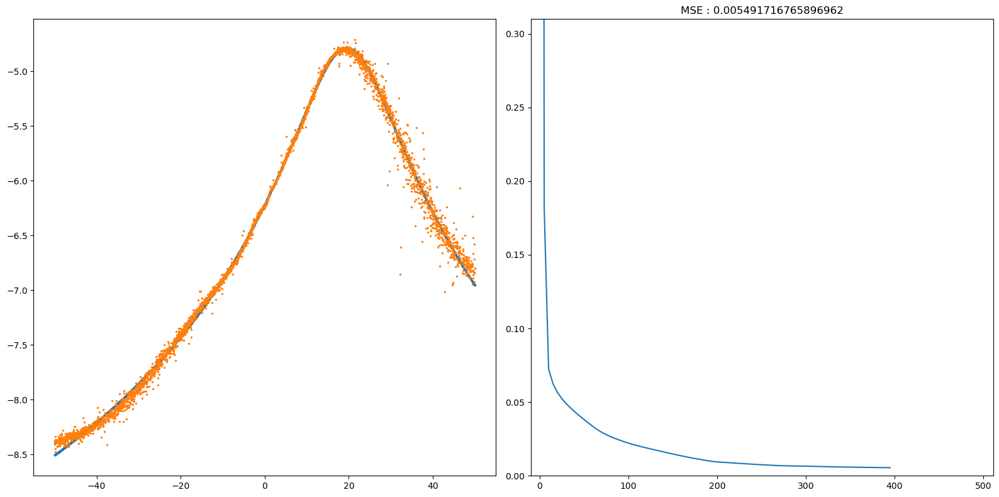

Epoch : 400 | MSE : 0.005452441480567747


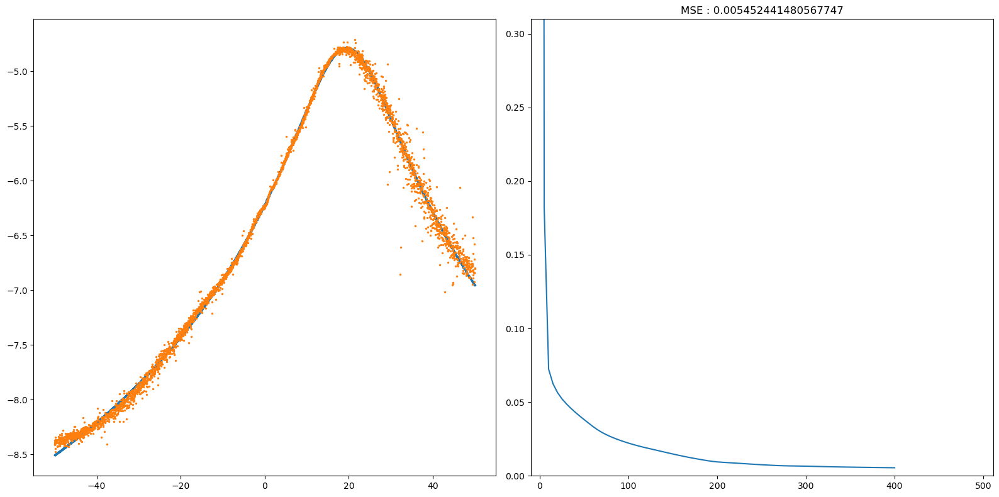

Epoch : 405 | MSE : 0.0054139058233502


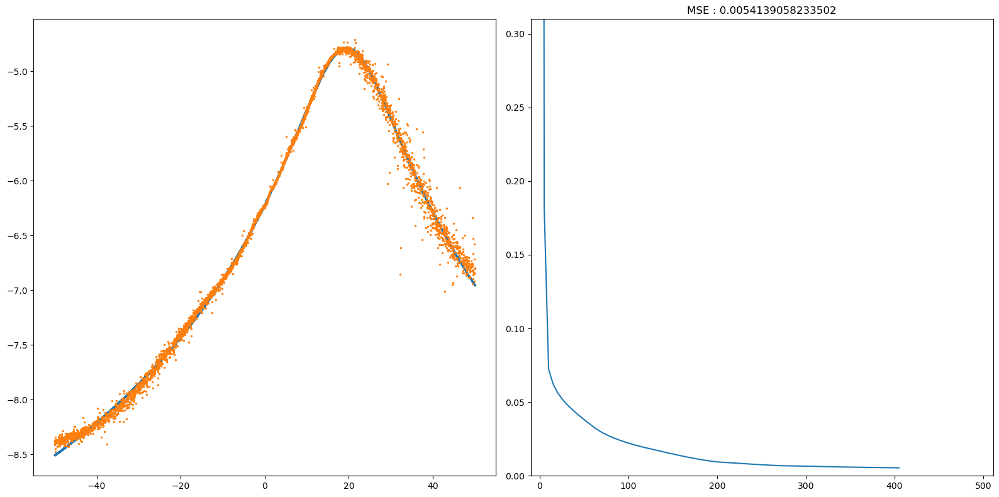

Epoch : 410 | MSE : 0.00537608020559162


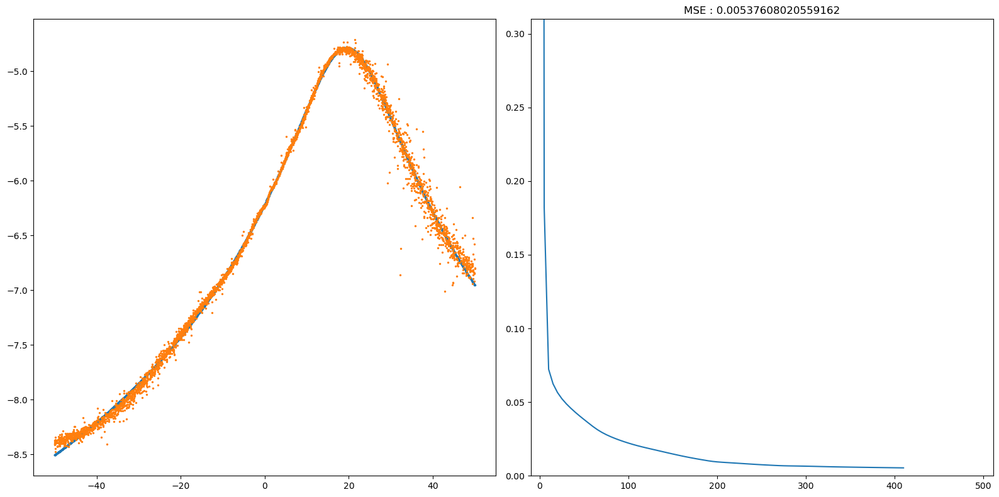

Epoch : 415 | MSE : 0.005338931688015214


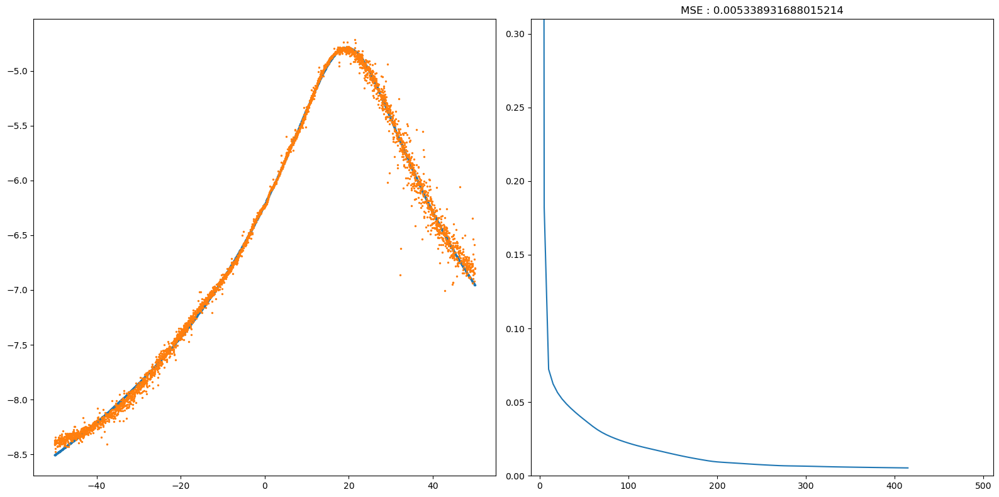

Epoch : 420 | MSE : 0.005302426117396812


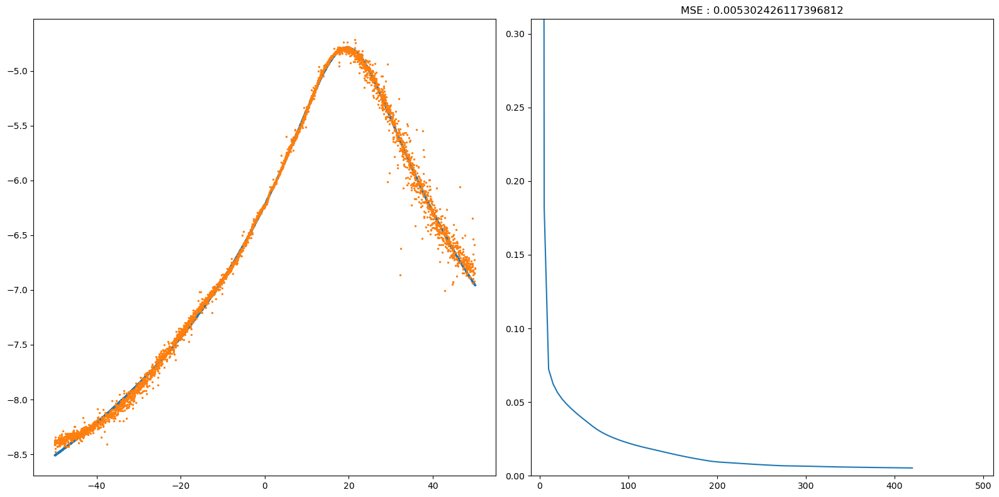

Epoch : 425 | MSE : 0.005266529752616117


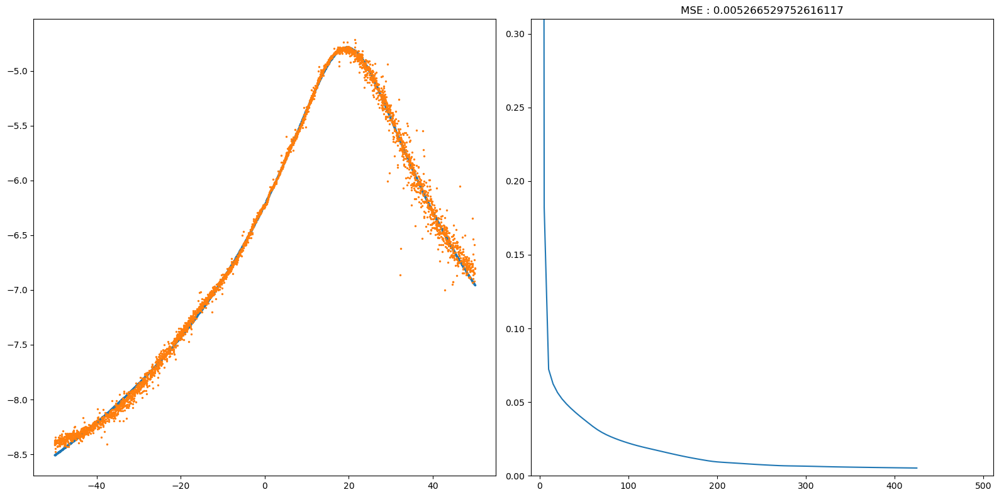

Epoch : 430 | MSE : 0.005231210315279484


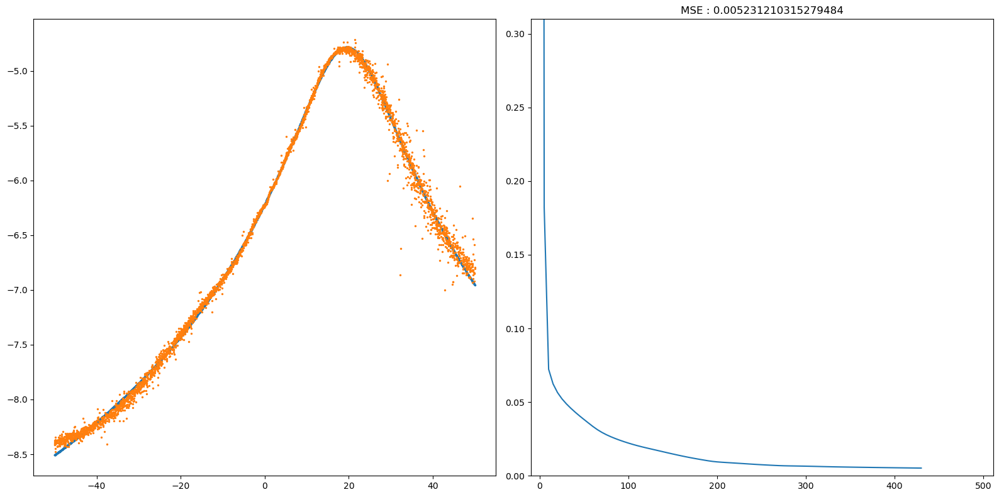

Epoch : 435 | MSE : 0.005196437555616802


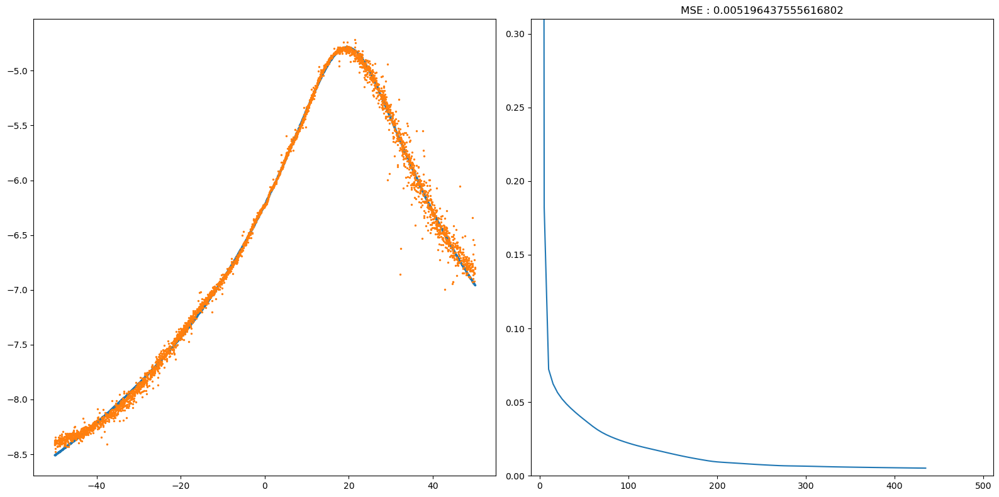

Epoch : 440 | MSE : 0.0051621834751232176


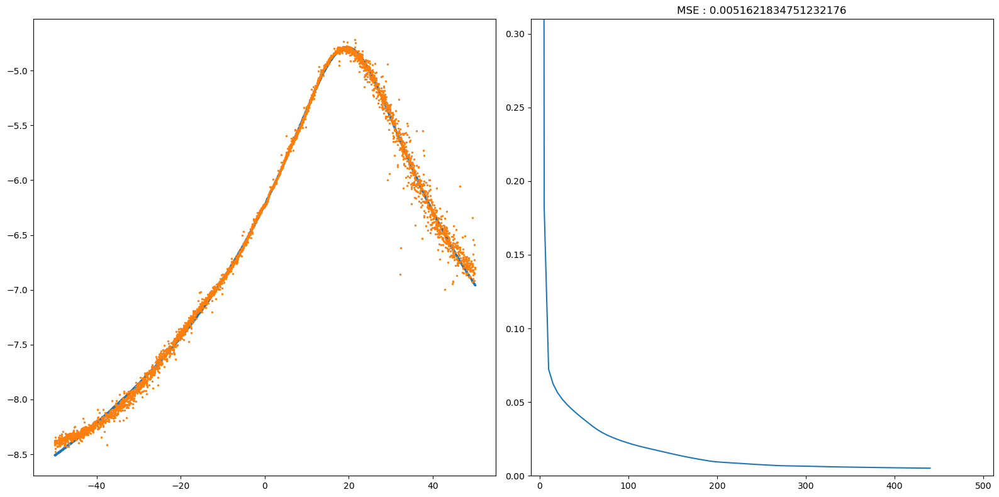

Epoch : 445 | MSE : 0.005128422340394666


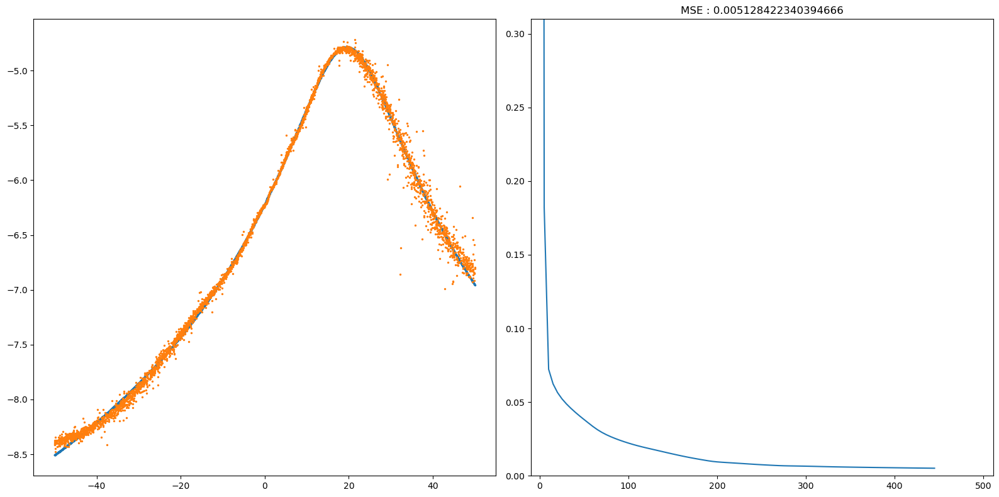

Epoch : 450 | MSE : 0.005095130591580483


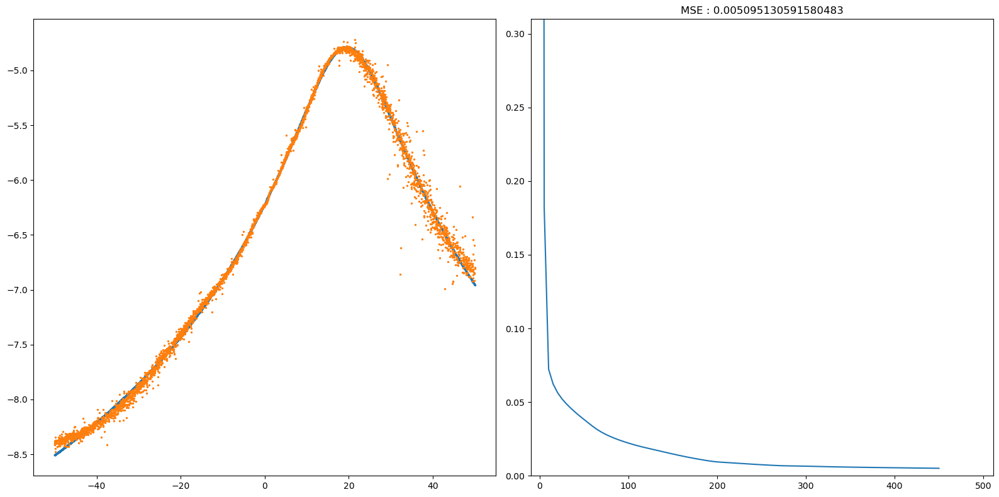

Epoch : 455 | MSE : 0.005062286713304612


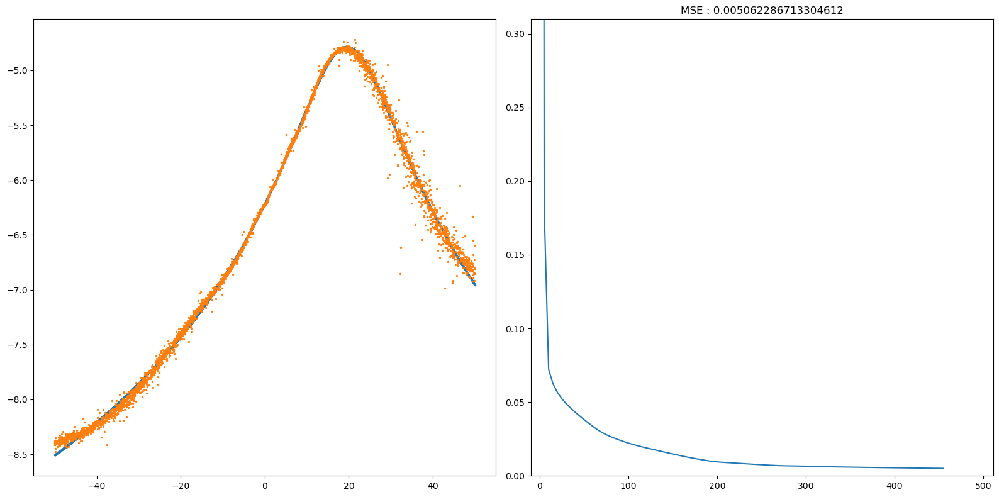

Epoch : 460 | MSE : 0.005029871105156715


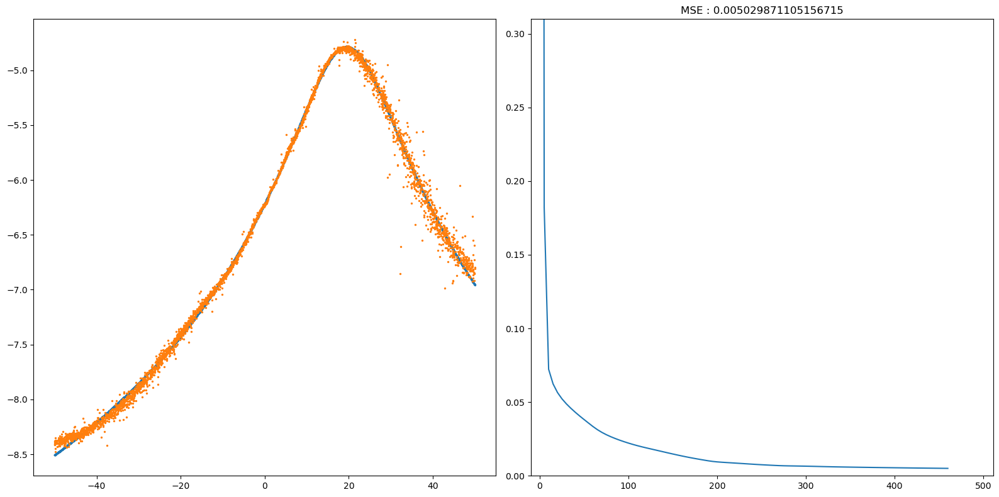

Epoch : 465 | MSE : 0.004997865966225248


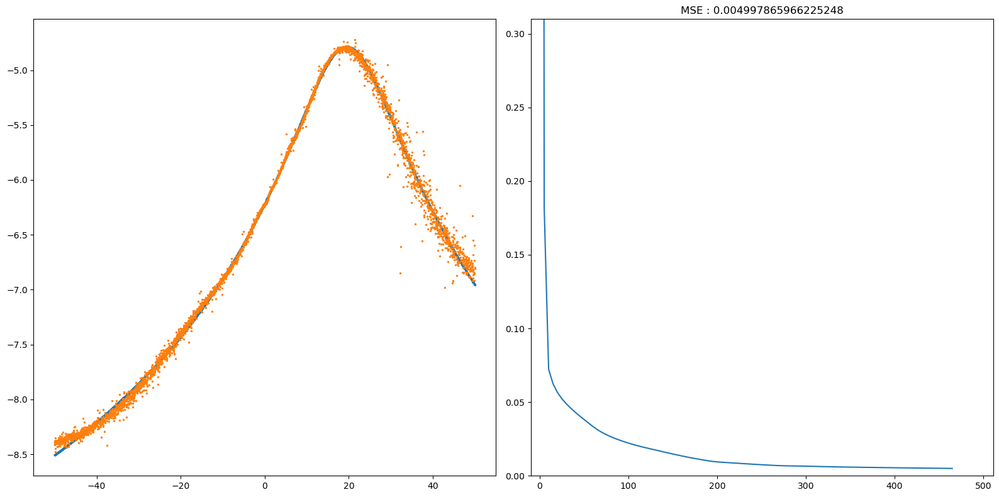

Epoch : 470 | MSE : 0.0049662551937867455


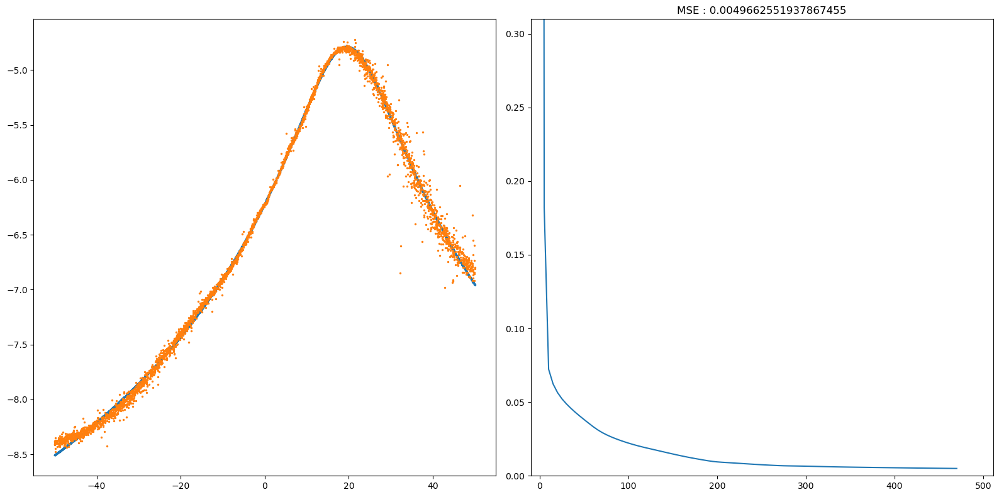

Epoch : 475 | MSE : 0.004935024288957751


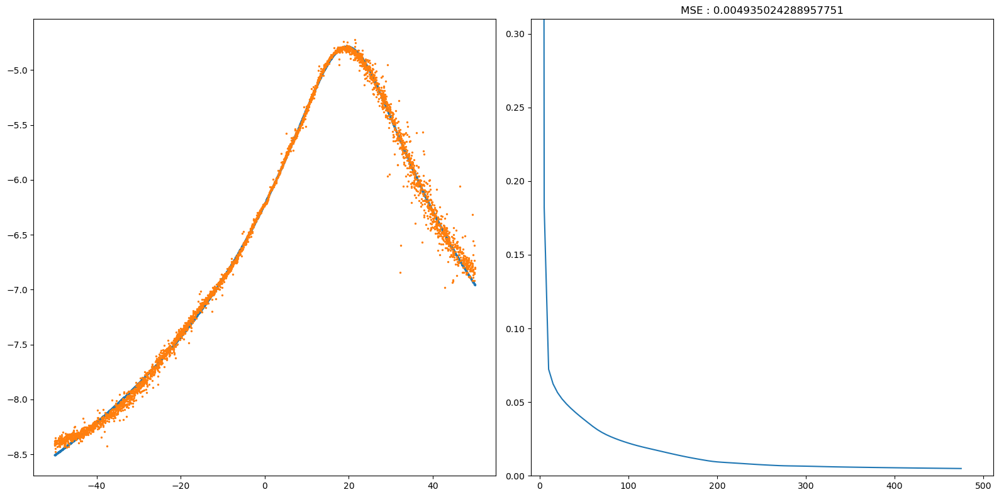

Epoch : 480 | MSE : 0.004904160260091484


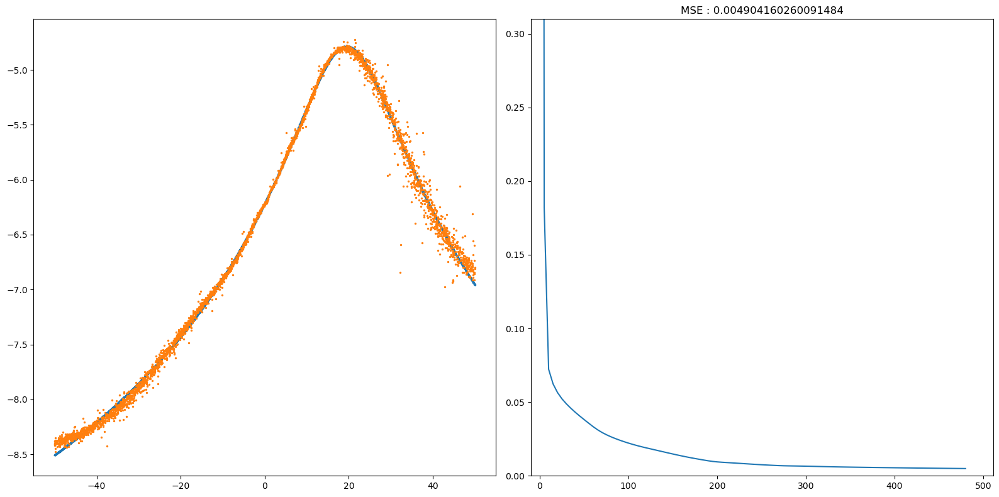

Epoch : 485 | MSE : 0.004873651516212407


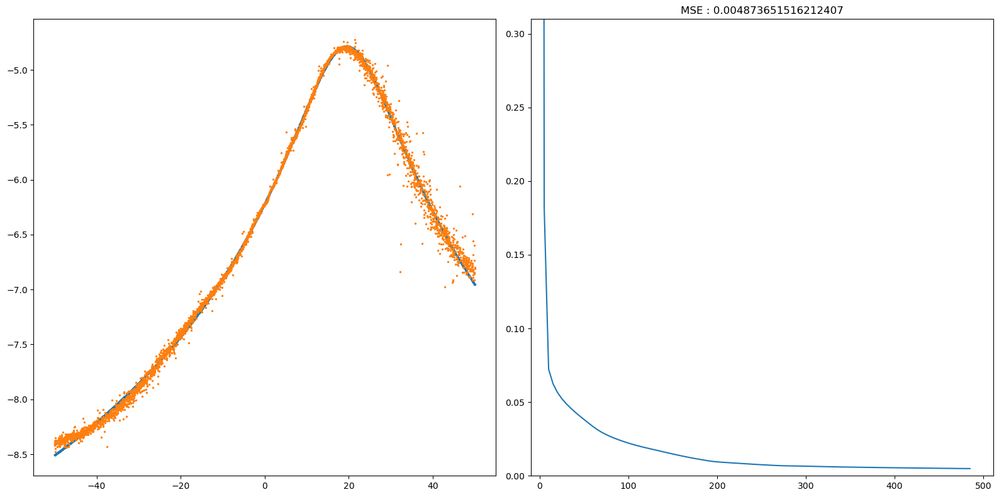

Epoch : 490 | MSE : 0.004843487746149208


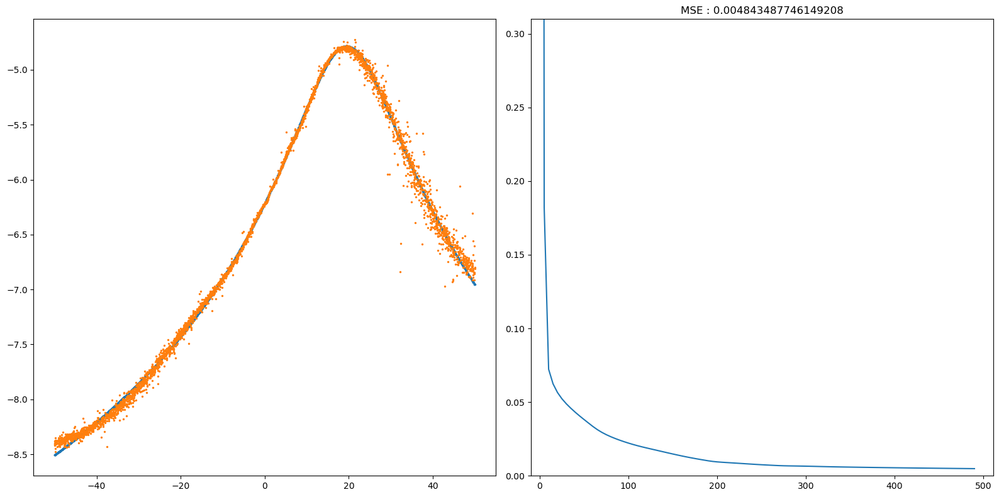

Epoch : 495 | MSE : 0.0048136597829919565


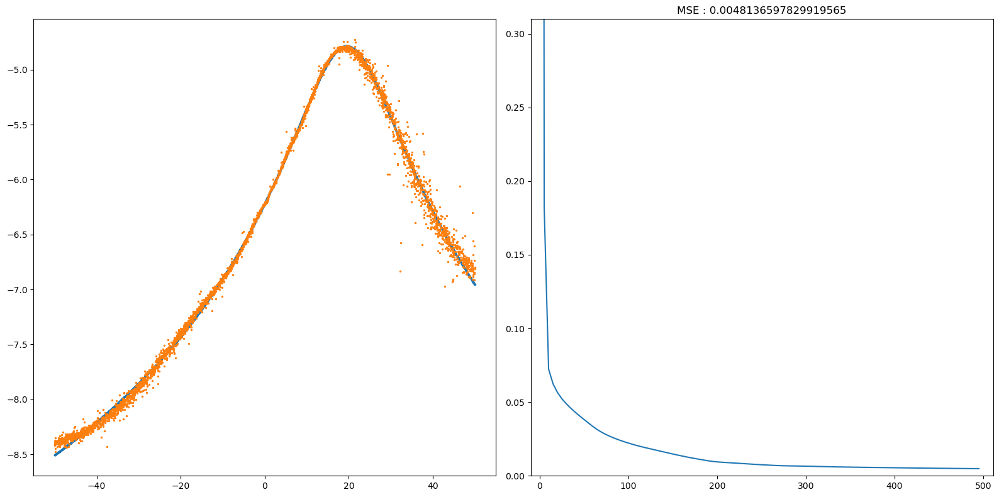

Epoch : 500 | MSE : 0.004784159457067888


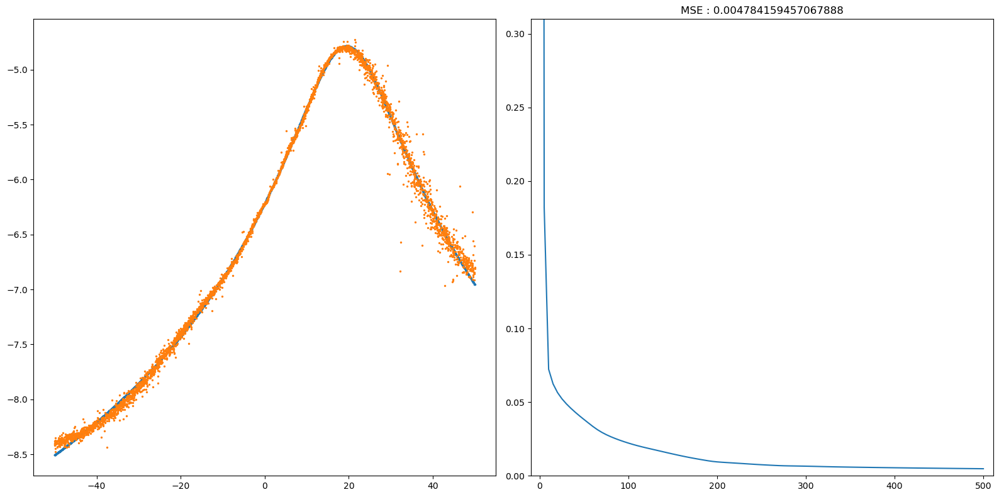



Test MSE : 2.7667068630265046


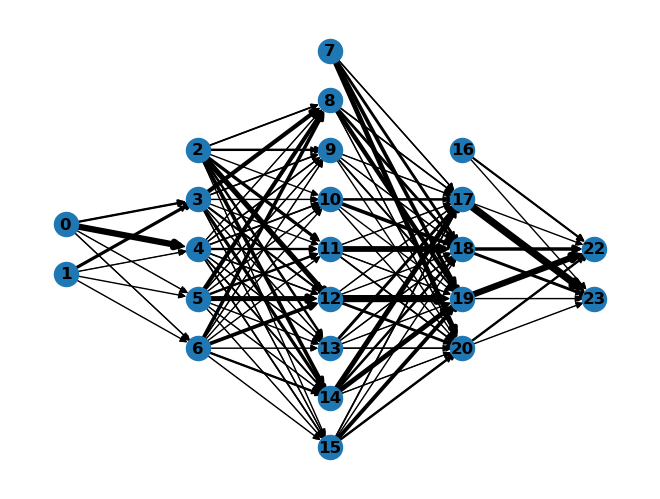

In [4]:
from sklearn.model_selection import train_test_split

np.random.seed(1998)

df = pd.read_csv('hw3_data.csv')

X = df['x'].to_numpy()
y = df['y'].to_numpy()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1998)

history = []

model.fit(X_train, y_train, early_stopping=0.0001, print_jump=5, history=True)
y_test_pred = model.predict(X_test)

print(f'\n\nTest MSE : {((y_test - y_test_pred)**2).mean()}')

model.result(graph=True)

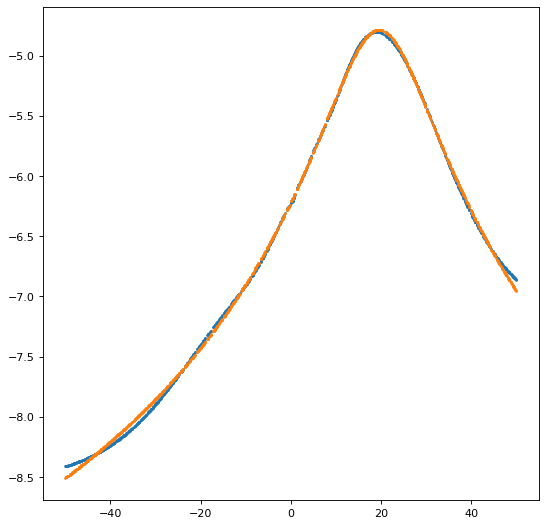

In [5]:
plt.figure(figsize=(8, 8), dpi=80)
plt.scatter(X_test, y_test_pred, s=2)
plt.scatter(X_test, y_test, s=2)
plt.show()

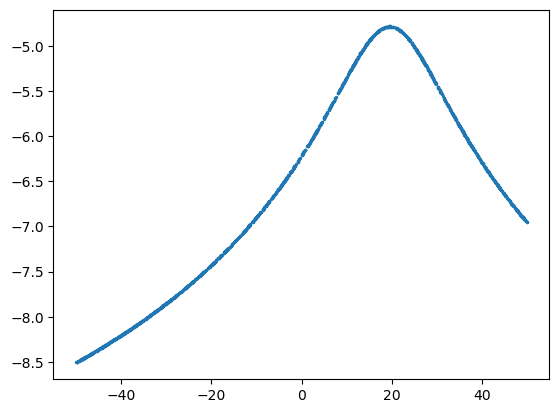

In [6]:
plt.scatter(X_test, y_test, s=2)

In [7]:
print(model._model['params'])

[{'w': array([[ 0.86559703],
       [ 0.16934807],
       [-0.04074102],
       [-0.04840727]]), 'b': array([[-0.62131118],
       [-1.69227828],
       [ 0.14486564],
       [ 0.2726653 ]])}, {'w': array([[-1.14317884, -0.19807719, -1.0956175 , -0.9464194 ],
       [-0.42183356, -0.39634244, -0.28193942, -0.26519271],
       [ 0.18835332,  0.4604627 ,  0.196893  ,  0.08042776],
       [-0.04695649, -0.63528868, -0.65160954, -0.09517421],
       [-0.57856558, -0.41202364, -1.35056763, -0.99919844],
       [ 0.2338379 ,  0.32957321,  0.12331997, -0.09561573],
       [ 0.87113785,  0.49078162,  0.22489726,  0.62998866],
       [ 0.31657414,  0.45646341, -0.17535194, -0.0993499 ]]), 'b': array([[-0.47160482],
       [ 0.65089026],
       [ 0.00868813],
       [-0.88830515],
       [ 1.4248608 ],
       [-0.65507567],
       [-0.99573567],
       [ 0.09300561]])}, {'w': array([[ 0.43042537,  0.24417309,  0.66767853,  0.21959702,  0.25334494,
         0.79619809,  1.35585083, -0.44406356],
